# Start up

## Imports

In [11]:
!source activate /home/gilbee3/anaconda3/envs/akita

In [12]:
import pygenometracks

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import operator as op
import seaborn as sns
sns.set(color_codes=True) # Seaborn desaturates matplotlib colors (this is useful if you use both seaborn and basic matplot lib and want colors to be consistent)
import scipy.stats as stats
sns.set(palette='husl', context = 'poster', style='white')
from os import path
import math
import sys, os, importlib

filename='/dors/capra_lab/users/erin/RotationProject_Akita/scripts/basenji/basenji'
sys.path.append(os.path.dirname(filename))

In [14]:
import scikit_posthocs as sp

In [15]:

import json
import subprocess
os.environ["CUDA_VISIBLE_DEVICES"] = '-1' ### run on CPU

import tensorflow as tf
# print(tf.__version__)
# if tf.__version__[0] == '1':
#     tf.compat.v1.enable_eager_execution()

tf.compat.v1.enable_eager_execution()
import pysam
from cooltools.lib.numutils import set_diag

from basenji import dataset, dna_io, seqnn

## Load Akita model

In [6]:
ls ../scripts/basenji/manuscripts/akita

data/                get_model.sh*    params.json
explore_model.ipynb  keras_print.txt  README.md
get_data.sh*         model_best.h5    tutorial.ipynb


In [7]:
### load params, specify model ###

model_dir = '../scripts/basenji/manuscripts/akita/'
params_file = model_dir+'params.json'
model_file  = model_dir+'model_best.h5'
with open(params_file) as params_open:
    params = json.load(params_open)
    params_model = params['model']
    params_train = params['train']

seqnn_model = seqnn.SeqNN(params_model)

### restore model ###
# note: run %%bash get_model.sh 
# if you have not already downloaded the model
seqnn_model.restore(model_file)
print('successfully loaded')

### names of targets ###
data_dir =   '../scripts/basenji/manuscripts/akita/data/'

hic_targets = pd.read_csv(data_dir+'/targets.txt',sep='\t')
hic_file_dict_num = dict(zip(hic_targets['index'].values, hic_targets['file'].values) )
hic_file_dict     = dict(zip(hic_targets['identifier'].values, hic_targets['file'].values) )
hic_num_to_name_dict = dict(zip(hic_targets['index'].values, hic_targets['identifier'].values) )

# read data parameters
data_stats_file = '%s/statistics.json' % data_dir
with open(data_stats_file) as data_stats_open:
    data_stats = json.load(data_stats_open)
seq_length = data_stats['seq_length']
target_length = data_stats['target_length']
hic_diags =  data_stats['diagonal_offset']
target_crop = data_stats['crop_bp'] // data_stats['pool_width']
target_length1 = data_stats['seq_length'] // data_stats['pool_width']

target_length1_cropped = target_length1 - 2*target_crop
print('flattened representation length:', target_length) 
print('symmetrix matrix size:', '('+str(target_length1_cropped)+','+str(target_length1_cropped)+')')


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
sequence (InputLayer)           [(None, 1048576, 4)] 0                                            
__________________________________________________________________________________________________
stochastic_reverse_complement ( ((None, 1048576, 4), 0           sequence[0][0]                   
__________________________________________________________________________________________________
stochastic_shift (StochasticShi (None, 1048576, 4)   0           stochastic_reverse_complement[0][
__________________________________________________________________________________________________
re_lu (ReLU)                    (None, 1048576, 4)   0           stochastic_shift[0][0]           
____________________________________________________________________________________________

successfully loaded
flattened representation length: 99681
symmetrix matrix size: (448,448)


## Functions

In [8]:
def read_ind_3dpreds(indname):
    if path.exists('/dors/capra_lab/users/erin/RotationProject_Akita/data/3dpreds/3dpredsPerIndiv'+indname+'.txt.gz'):
        df = pd.read_table('/dors/capra_lab/users/erin/RotationProject_Akita/data/3dpreds/3dpredsPerIndiv3dpreds_'+indname+'.txt.gz'
                           , header=None)
    else:
        df = pd.read_table('/dors/capra_lab/users/erin/RotationProject_Akita/data/3dpreds/3dpredsPerIndiv3dpreds_'+indname+'.txt'
                           , header=None)
        
    df=df.rename(columns={0: "chr", 1: "pos"})
    df = df.set_index(['chr','pos'])
    return df

In [9]:
def within_pop_spearman(pop, super_pop):
    pop_spear = []
    comp_pairs = []
    for indiv in super_pop[pop]:
        for jndiv in super_pop[pop]:
            if indiv ==jndiv:
                pass
            elif [indiv,jndiv] not in comp_pairs and [jndiv,indiv] not in comp_pairs:
                try:
                    pop_spear.append(pairs[indiv,jndiv].spearman.mean())
                    comp_pairs.append([indiv,jndiv])
                except:
                    pop_spear.append(pairs[jndiv,indiv].spearman.mean())
                    comp_pairs.append([jndiv,indiv])
    return pop_spear

def within_pop_mse(pop, super_pop):
    pop_mse = []
    comp_pairs = []
    for indiv in super_pop[pop]:
        for jndiv in super_pop[pop]:
            if indiv ==jndiv:
                pass
            elif [indiv,jndiv] not in comp_pairs and [jndiv,indiv] not in comp_pairs:
                try:
                    pop_mse.append(pairs[indiv,jndiv].mse.mean())
                    comp_pairs.append([indiv,jndiv])
                except:
                    pop_mse.append(pairs[jndiv,indiv].mse.mean())
                    comp_pairs.append([jndiv,indiv])

    return pop_mse

In [10]:
def within_pop_spearman_regions(chrm):
    chrm_spear = []
    for pos in regions_dict[chrm]:
        pos_spear=[]
        for pair in pairs:
            spear = pairs[pair].spearman
            pos_spear.append(spear)
        chrm_spear.append(pos_spear)
    return chrm_spear

In [11]:
def one_pop_mses(cur_pop, super_pop):
    between_mses = []
    within_mses = []
    for indiv in super_pop[cur_pop]:
        for pop in super_pop:
            if pop != cur_pop:
                for jndiv in super_pop[pop]:
                    try:
                        between_mses.append(pairs[indiv,jndiv].mse.mean())
                    except:
                        between_mses.append(pairs[jndiv,indiv].mse.mean())
            else:
                for jndiv in super_pop[pop]:
                    if jndiv != indiv:
                        try:
                            within_mses.append(pairs[indiv,jndiv].mse.mean())
                        except:
                            within_mses.append(pairs[jndiv,indiv].mse.mean())
    return between_mses, within_mses

In [12]:
def fst3D(b,w, avg):
    if avg:
        b = np.mean(b)
        w = np.mean(w)
    return (b-w)/b

In [13]:
def one_pop_comps(sub_pop, super_pops):
    within_comps = []
    between_comps = []
    missing = []
    for pop in super_pops.keys():
        print(pop)
        if pop == sub_pop:
            for indiv in super_pops[sub_pop]:
                for jndiv in super_pops[pop]:
                    if indiv!=jndiv:
                        name1 = str(indiv + '_VS_' + jndiv)
                        name2 = str(jndiv + '_VS_' + indiv)
                        if name1 in all_mse.columns:
                            within_comps.append(name1)
                        elif name2 in all_mse.columns:
                            within_comps.append(name2)
                        else:
                            missing.append([name1,name2])
        else:
            for indiv in super_pops[sub_pop]:
                for jndiv in super_pops[pop]:
                    if indiv!=jndiv:
                        name1 = str(indiv + '_VS_' + jndiv)
                        name2 = str(jndiv + '_VS_' + indiv)
                        if name1 in all_mse.columns and name1 not in between_comps:
                            between_comps.append(name1)
                        elif name2 in all_mse.columns and name2 not in between_comps:
                            between_comps.append(name2)
                        else:
                            missing.append([name1,name2])
                            
    return within_comps, between_comps

In [50]:
def pairs_df(pop):
    pairs_spearman = pd.DataFrame([])
    pairs_mse = pd.DataFrame([])
    comps = []
    missing = []
    for i1 in pop:
        print(i1)
        for i2 in pop:
            name1 = (i1 + '_VS_' + i2)
            key1 = (i1,i2)
            name2 = (i2 + '_VS_' + i1)
            key2 = (i2,i1)
            if key1 in pairs.keys() and name1 not in comps:
                pair = pairs[key1]
                pair = pair[pair.chr != 'chrX']
                pair_sp = regionsToKeep.merge(pair, how='inner',on=['chr','windowStartPos'])[['chr','windowStartPos','spearman']] # only keep windows with full coverage in 1kg
                pair_sp.columns = ['chr','windowStartPos',name1]

                pair_mse = regionsToKeep.merge(pair, how='inner',on=['chr','windowStartPos'])[['chr','windowStartPos','mse']] # only keep windows with full coverage in 1kg
                pair_mse.columns = ['chr','windowStartPos',name1]
                if pairs_spearman.empty:
                     pairs_spearman = pair_sp
                else:
                    pairs_spearman = pairs_spearman.merge(pair_sp, on=['chr','windowStartPos'])
                if pairs_mse.empty:
                     pairs_mse = pair_mse
                else:
                    pairs_mse = pairs_mse.merge(pair_mse, on=['chr','windowStartPos'])
                comps.append(name1)
            elif key2 in pairs.keys() and name2 not in comps:
                pair = pairs[key2]
                pair = pair[pair.chr != 'chrX']
                pair_sp = regionsToKeep.merge(pair, how='inner',on=['chr','windowStartPos'])[['chr','windowStartPos','spearman']] # only keep windows with full coverage in 1kg
                pair_sp.columns = ['chr','windowStartPos',name2]

                pair_mse = regionsToKeep.merge(pair, how='inner',on=['chr','windowStartPos'])[['chr','windowStartPos','mse']] # only keep windows with full coverage in 1kg
                pair_mse.columns = ['chr','windowStartPos',name2]
                if pairs_spearman.empty:
                     pairs_spearman = pair_sp
                else:
                    pairs_spearman = pairs_spearman.merge(pair_sp, on=['chr','windowStartPos'])
                if pairs_mse.empty:
                     pairs_mse = pair_mse
                else:
                    pairs_mse = pairs_mse.merge(pair_mse, on=['chr','windowStartPos'])
                comps.append(name2)
            else:
                missing.append([i1,i2])
    return pairs_spearman, pairs_mse, comps, missing

In [15]:
def make_metrics_dict(pops_dict, code):
    pop_spears = {}
    pop_mses = {}
    for pop in pops_dict.keys():
        pop_spears[pop] = within_pop_spearman(pop, pops_dict)
        pop_mses[pop] = within_pop_mse(pop, pops_dict)

    all_spears = []
    all_mse = []
    for pair in pairs:
        if pair[0].startswith(code) and pair[1].startswith(code):
            all_spears.append(pairs[pair].spearman.mean())
            all_mse.append(pairs[pair].mse.mean())
    pop_spears[str('all_'+code)] = all_spears
    pop_mses[str('all_'+code)] = all_mse
    
    return pop_spears, pop_mses

In [584]:
def plot_subpop_avgs(dicty, code, name, m):
    keys, values = list(dicty.keys()), list(dicty.values())
    #sorted_keys, sorted_vals = zip(*sorted(pop_spears.items(), key=op.itemgetter(1)))
    fig, ax = plt.subplots(figsize=[10,5])
    sns.swarmplot(data=values, size=6, linewidth=.9, edgecolor="white")
    sns.boxplot(data=values, width=.18)
    ax.set(xlabel=str(name +"Sub-populations"), ylabel=("Average Pairwise %s within Population" % m))     

    # category labels
    plt.xticks(plt.xticks()[0], keys)
    y = [np.quantile(dicty[code], 0.2)]*5
    ax.hlines(y, xmin=-0.5, xmax=5.5, label='20%ile', color='teal')
    plt.text(x=5.6,y=np.quantile(dicty[code], 0.2), s=str(code + ' 20%ile'))
    plt.show()
    for pop in dicty:
        print(pop + ' avg: '+str(np.mean(dicty[pop])))
    print(code + ' 20%ile: ' + str(np.quantile(dicty[code], 0.2)))
    
def plot_super_means(dicty, m):
    keys, values = list(dicty.keys()), list(dicty.values())
    #sorted_keys, sorted_vals = zip(*sorted(pop_spears.items(), key=op.itemgetter(1)))
    fig, ax = plt.subplots(figsize=[10,5])
    sns.stripplot(data=values, size=6, linewidth=.9, edgecolor="white", dodge=True)
    sns.boxplot(data=values, width=.18)
    ax.set(xlabel=str("Populations"), ylabel=("Average Pairwise %s within Population" % m) )
    # category labels
    plt.xticks(plt.xticks()[0], keys)
    plt.show()
    for pop in dicty:
        print(pop + ' avg: '+str(np.mean(dicty[pop])))

In [17]:
def mean_vals_one_chr(chrm, metric, df):
    df = df[df.chr==chrm]
    df=pd.melt(df.drop(columns='chr'),"windowStartPos")
    plt.figure(figsize=[20,5])
    box=sns.boxplot(x="windowStartPos", y="value", data=df, palette='viridis')
    box.set(xticklabels=[])
    plt.title('Chr 22')
    box.set_ylabel(metric)
    plt.show()
    
def mean_vals_all_chr(metric, df):
    df=pd.melt(df.drop(columns='windowStartPos'),"chr")
    plt.figure(figsize=[30,5])
    box=sns.boxplot(x="chr", y="value", data=df, palette='viridis', showfliers = False)
    box.set_ylabel(metric)
    plt.show()

In [127]:
def read_ind_3dpreds(indname, zipped):
    if zipped:
        df = pd.read_table('/dors/capra_lab/users/erin/RotationProject_Akita/data/3dpreds/3dpredsPerIndiv/nonHarmonized/3dpreds_'+indname+'.txt.gz'
                           , header=None)
    else:
        df = pd.read_table('/dors/capra_lab/users/erin/RotationProject_Akita/data/3dpreds/3dpredsPerIndiv/nonHarmonized/3dpreds_'+indname+'.txt'
                           , header=None)
    df=df.rename(columns={0: "chr", 1: "pos"})
    df = df.set_index(['chr','pos'])
    return df

def from_upper_triu(vector_repr, matrix_len, num_diags):
    z = np.zeros((matrix_len,matrix_len))
    triu_tup = np.triu_indices(matrix_len,num_diags)
    z[triu_tup] = vector_repr
    for i in range(-num_diags+1,num_diags):
        set_diag(z, np.nan, i)
    return z + z.T

In [212]:
def plot_one(mat, subplt, name, num_pairs):
# plot pred
    plt.subplot(num_pairs,2,subplt) 
    vmin=-2; vmax=2
#     mat = from_upper_triu(vec, 448, 2)
    im = plt.matshow(mat, fignum=False, cmap= 'RdBu_r', vmax=vmax, vmin=vmin)
    plt.colorbar(im, fraction=.04, pad = 0.05, ticks=[-2,-1, 0, 1,2]);
    plt.title('pred-'+name,y=1.15 )


def pair_of_plots(mat1, mat2, ind1, ind2, subplt, num_pairs):
    plot_one(mat1, subplt[0], ind1, num_pairs)
    plot_one(mat2, subplt[1], ind2, num_pairs)

    
    

In [505]:
def find_inFileLoc(indiv, chrm):
    if (indiv == "vindija") | (indiv == "altai") | (indiv == "denisova") | (indiv == "chagyrskaya"):
        in_file_loc = '/gpfs51/dors2/capra_lab/users/rinkerd/projects/3DNeand/data/genomes/%s/%s%s_hg19_masked.fa' % (indiv,chrm,indiv)
    elif os.path.exists('/dors/capra_lab/users/erin/RotationProject_Akita/data/genomes/1KG/%s/%s_%s_hg19_full.fa' % (indiv,chrm,indiv.split("_")[3])):
        in_file_loc = '/dors/capra_lab/users/erin/RotationProject_Akita/data/genomes/1KG/%s/%s_%s_hg19_full.fa' % (indiv,chrm,indiv.split("_")[3])
    else:
        in_file_loc = '/gpfs51/dors2/capra_lab/users/rinkerd/projects/3DNeand/data/genomes/1KG.individuals/%s/%s_%s_hg19_full.fa' % (indiv,chrm,indiv.split("_")[3])
    return in_file_loc

def runAkitaPreds(seq):
    #if len(seq) != 2**20: raise ValueError('len(seq) != seq_length')
    seq_1hot = dna_io.dna_1hot(seq)
    test_pred_from_seq = seqnn_model.model.predict(np.expand_dims(seq_1hot,0))
    return test_pred_from_seq

class extractFastaRunAkita:
    def __init__(self, indiv, chrm, start_loc, end):

        #find fasta file locations
        in_file_loc_indiv = find_inFileLoc(indiv, chrm)
        indiv_fasta_open = pysam.Fastafile(in_file_loc_indiv)
        mask_fasta_open = pysam.Fastafile('/gpfs51/dors2/capra_lab/users/rinkerd/projects/3DNeand/data/genomes/masked_hg19_reference/%s_hg19_archaic.masked.fa' % chrm) #for the masked
        human19_fasta_open = pysam.Fastafile('/dors/capra_lab/data/dna/human/hg19/%s.fa' % chrm)

        #extract sequences
        indiv_seq = indiv_fasta_open.fetch(chrm, start_loc, end).upper()
        masked_seq = mask_fasta_open.fetch(chrm, start_loc, end).upper() #for the masked 
        human19_seq = human19_fasta_open.fetch(chrm, start_loc, end).upper()

        # important harmonization step! then run predictions on the harmonized sequence
        indiv_fillMissing_seq = "".join([r if m == "N" else r if s == "N" else s for r, m, s in zip(human19_seq, masked_seq, indiv_seq)])
        self.seq = indiv_fillMissing_seq
        indiv_pred  = runAkitaPreds(indiv_fillMissing_seq)
        indiv_pred_hff = indiv_pred[:,:,0][0] # save only hff
        self.pred = indiv_pred_hff
        #return(indiv_pred_hff)

## Data organization

### Reference structures

In [2]:
sas = ['SAS_BEB_female_HG03616',
    'SAS_BEB_female_HG03931',
    'SAS_BEB_female_HG03793',
    'SAS_GIH_female_NA21102',
    'SAS_BEB_female_HG03829',
    'SAS_BEB_female_HG03823',
    'SAS_GIH_female_NA20872',
    'SAS_GIH_female_NA20877',
    'SAS_GIH_female_NA20876',
    'SAS_GIH_female_NA21125',
    'SAS_ITU_female_HG03772',
    'SAS_ITU_female_HG03973',
    'SAS_ITU_female_HG03968',
    'SAS_ITU_female_HG03774',
    'SAS_ITU_female_HG03780',
    'SAS_PJL_female_HG02787',
    'SAS_PJL_female_HG03016',
    'SAS_PJL_female_HG02697',
    'SAS_PJL_female_HG03634',
    'SAS_PJL_female_HG02731',
    'SAS_STU_female_HG03643',
    'SAS_STU_female_HG03673',
    'SAS_STU_female_HG03849',
    'SAS_STU_female_HG04042',
    'SAS_STU_female_HG04099']
sas_pops = {'BEB': ['SAS_BEB_female_HG03616',
                'SAS_BEB_female_HG03931',
                'SAS_BEB_female_HG03793',
                'SAS_BEB_female_HG03829',
                'SAS_BEB_female_HG03823'], 
           'GIH':['SAS_GIH_female_NA21102',
                'SAS_GIH_female_NA20872',
                'SAS_GIH_female_NA20877',
                'SAS_GIH_female_NA20876',
                'SAS_GIH_female_NA21125'], 
           'ITU':['SAS_ITU_female_HG03772',
                'SAS_ITU_female_HG03973',
                'SAS_ITU_female_HG03968',
                'SAS_ITU_female_HG03774',
                'SAS_ITU_female_HG03780'],
          'PJL': ['SAS_PJL_female_HG02787',
                'SAS_PJL_female_HG03016',
                'SAS_PJL_female_HG02697',
                'SAS_PJL_female_HG03634',
                'SAS_PJL_female_HG02731'],
          'STU' : ['SAS_STU_female_HG03643',
                'SAS_STU_female_HG03673',
                'SAS_STU_female_HG03849',
                'SAS_STU_female_HG04042',
                'SAS_STU_female_HG04099']}
len(sas)

25

In [3]:
eur = ['EUR_CEU_female_NA12006',
    'EUR_FIN_female_HG00285',
    'EUR_GBR_female_HG00261',
    'EUR_IBS_female_HG01519',
    'EUR_TSI_female_NA20795',
    'EUR_IBS_female_HG01773',
    'EUR_IBS_female_HG01516',
    'EUR_IBS_female_HG01632',
    'EUR_IBS_female_HG01668',
    'EUR_CEU_female_NA12717',
    'EUR_CEU_female_NA12815',
    'EUR_CEU_female_NA12156',
    'EUR_CEU_female_NA12749',
    'EUR_FIN_female_HG00288',
    'EUR_FIN_female_HG00323',
    'EUR_FIN_female_HG00304',
    'EUR_FIN_female_HG00344',
    'EUR_TSI_female_NA20821',
    'EUR_GBR_female_HG00231',
    'EUR_TSI_female_NA20508',
    'EUR_TSI_female_NA20797',
    'EUR_TSI_female_NA20771',
    'EUR_GBR_female_HG00106',
    'EUR_GBR_female_HG00122',
    'EUR_GBR_female_HG00099']
eur_pops = {'CEU':['EUR_CEU_female_NA12006',
                'EUR_CEU_female_NA12717',
                'EUR_CEU_female_NA12815',
                'EUR_CEU_female_NA12156',
                'EUR_CEU_female_NA12749'],
            'FIN':['EUR_FIN_female_HG00285',
                'EUR_FIN_female_HG00288',
                'EUR_FIN_female_HG00323',
                'EUR_FIN_female_HG00304',
                'EUR_FIN_female_HG00344'],
           'GBR':['EUR_GBR_female_HG00261',
                'EUR_GBR_female_HG00231',
                'EUR_GBR_female_HG00106',
                'EUR_GBR_female_HG00122',
                'EUR_GBR_female_HG00099'],
           'IBS':['EUR_IBS_female_HG01519',
                'EUR_IBS_female_HG01773',
                'EUR_IBS_female_HG01516',
                'EUR_IBS_female_HG01632',
                'EUR_IBS_female_HG01668'],
           'TSI':['EUR_TSI_female_NA20795',
                'EUR_TSI_female_NA20821',
                'EUR_TSI_female_NA20508',
                'EUR_TSI_female_NA20797',
                'EUR_TSI_female_NA20771']}
len(eur)

25

In [4]:
eas = ['EAS_CHB_female_NA18625',
    'EAS_CHB_female_NA18626',
    'EAS_CDX_female_HG00978',
    'EAS_CHB_female_NA18595',
    'EAS_CHS_female_HG00560',
    'EAS_KHV_female_HG01851',
    'EAS_KHV_female_HG02016',
    'EAS_KHV_female_HG02075',
    'EAS_KHV_female_HG02069',
    'EAS_JPT_female_NA18951',
    'EAS_KHV_female_HG02057',
    'EAS_KHV_female_HG02127',
    'EAS_CDX_female_HG02181',
    'EAS_JPT_female_NA18975',
    'EAS_JPT_female_NA18999',
    'EAS_JPT_female_NA18978',
    'EAS_JPT_female_NA19001',
    'EAS_CDX_female_HG02185',
    'EAS_CDX_female_HG01817',
    'EAS_CDX_female_HG00879',
    'EAS_CDX_female_HG01808',
    'EAS_CHS_female_HG00608',
    'EAS_CHS_female_HG00611',
    'EAS_CHS_female_HG00705',
    'EAS_CHS_female_HG00437',
    'EAS_CHS_female_HG00446',
    'EAS_CHB_female_NA18572',
    'EAS_CHB_female_NA18559',
    'EAS_CHB_female_NA18747']
eas_pops = {'CDX':['EAS_CDX_female_HG00978',
                'EAS_CDX_female_HG02181',
                'EAS_CDX_female_HG02185',
                'EAS_CDX_female_HG01817',
                'EAS_CDX_female_HG00879',
                'EAS_CDX_female_HG01808'],
            'CHB':['EAS_CHB_female_NA18625',
                'EAS_CHB_female_NA18626',
                'EAS_CHB_female_NA18595',
                'EAS_CHB_female_NA18572',
                'EAS_CHB_female_NA18559',
                'EAS_CHB_female_NA18747'],
            'CHS':['EAS_CHS_female_HG00560',
                'EAS_CHS_female_HG00608',
                'EAS_CHS_female_HG00611',
                'EAS_CHS_female_HG00705',
                'EAS_CHS_female_HG00437',
                'EAS_CHS_female_HG00446'],
            'JPT':['EAS_JPT_female_NA18951',
                'EAS_JPT_female_NA18975',
                'EAS_JPT_female_NA18999',
                'EAS_JPT_female_NA18978',
                'EAS_JPT_female_NA19001'],
            'KHV':['EAS_KHV_female_HG01851',
                'EAS_KHV_female_HG02016',
                'EAS_KHV_female_HG02075',
                'EAS_KHV_female_HG02069',
                'EAS_KHV_female_HG02057',
                'EAS_KHV_female_HG02127']}
len(eas)

29

In [5]:
amr = ['AMR_PUR_female_HG00732',
    'AMR_CLM_female_HG01357',
    'AMR_CLM_female_HG01438',
    'AMR_CLM_female_HG01281',
    'AMR_CLM_female_HG01441',
    'AMR_PUR_female_HG01242',
    'AMR_CLM_female_HG01269',
    'AMR_MXL_female_NA19794',
    'AMR_PUR_female_HG01198',
    'AMR_PUR_female_HG01080',
    'AMR_PUR_female_HG01188',
    'AMR_PUR_female_HG01067',
    'AMR_PUR_female_HG00737',
    'AMR_MXL_female_NA19740',
    'AMR_MXL_female_NA19725',
    'AMR_MXL_female_NA19722',
    'AMR_MXL_female_NA19734',
    'AMR_PEL_female_HG02252',
    'AMR_PEL_female_HG01927',
    'AMR_PEL_female_HG01945',
    'AMR_PEL_female_HG01954',
    'AMR_PEL_female_HG01933']
amr_pops = {'CLM':['AMR_CLM_female_HG01357',
                'AMR_CLM_female_HG01438',
                'AMR_CLM_female_HG01281',
                'AMR_CLM_female_HG01441',
                'AMR_CLM_female_HG01269'],
            'MXL':['AMR_MXL_female_NA19794',
                'AMR_MXL_female_NA19740',
                'AMR_MXL_female_NA19725',
                'AMR_MXL_female_NA19722',
                'AMR_MXL_female_NA19734'],
            'PEL':['AMR_PEL_female_HG02252',
                'AMR_PEL_female_HG01927',
                'AMR_PEL_female_HG01945',
                'AMR_PEL_female_HG01954',
                'AMR_PEL_female_HG01933'],
            'PUR':['AMR_PUR_female_HG00732',
                'AMR_PUR_female_HG01242',
                'AMR_PUR_female_HG01198',
                'AMR_PUR_female_HG01080',
                'AMR_PUR_female_HG01188',
                'AMR_PUR_female_HG01067',
                'AMR_PUR_female_HG00737']}
len(amr)

22

In [6]:
afr_20 = ['AFR_MSL_female_HG03086',
            'AFR_MSL_female_HG03378',
            'AFR_MSL_female_HG03437',
            'AFR_LWK_female_NA19378',
            'AFR_LWK_female_NA19445',
            'AFR_LWK_female_NA19434',
            'AFR_MSL_female_HG03212',
            'AFR_GWD_female_HG03040',
            'AFR_GWD_female_HG03028',
            'AFR_MSL_female_HG03085',
            'AFR_LWK_female_NA19017',
            'AFR_GWD_female_HG03539',
            'AFR_LWK_female_NA19019',
            'AFR_GWD_female_HG03046',
            'AFR_GWD_female_HG03025',
            'AFR_ESN_female_HG03105',
            'AFR_ESN_female_HG03511',
            'AFR_ESN_female_HG03514',
            'AFR_ESN_female_HG03499',
            'AFR_ESN_female_HG02922']
afr_pops = {'ESN': ['AFR_ESN_female_HG03105',
                    'AFR_ESN_female_HG03511',
                    'AFR_ESN_female_HG03514',
                    'AFR_ESN_female_HG03499',
                    'AFR_ESN_female_HG02922'], 
            'MSL' : ['AFR_MSL_female_HG03086',
                     'AFR_MSL_female_HG03378',
                     'AFR_MSL_female_HG03437',
                     'AFR_MSL_female_HG03212',
                     'AFR_MSL_female_HG03085'],
           'LWK': ['AFR_LWK_female_NA19378',
                'AFR_LWK_female_NA19445',
                'AFR_LWK_female_NA19434',
                   'AFR_LWK_female_NA19017',
                   'AFR_LWK_female_NA19019'], 
           'GWD' : ['AFR_GWD_female_HG03040',
                'AFR_GWD_female_HG03028',
                'AFR_GWD_female_HG03539',
                'AFR_GWD_female_HG03046',
                'AFR_GWD_female_HG03025']}
len(afr_20)

20

In [7]:
chrs = ['chr1',
        'chr2','chr3','chr4','chr5','chr6','chr7','chr8','chr9','chr10','chr11','chr12','chr13','chr14','chr15','chr16','chr17','chr18','chr19','chr20','chr21','chr22']

In [8]:
indivs = afr_20+amr+eas+eur+sas

In [9]:
super_pops = {'AFR':afr_20, 'AMR':amr,'EAS':eas,'EUR':eur, 'SAS':sas}

### loading files

In [10]:
coverage = pd.read_csv("/dors/capra_lab/users/erin/RotationProject_Akita/data/3dpreds/coveragePerIndiv/nonHarmonized/coverage_AFR_ESN_female_HG02922.txt.gz",sep="\t",header=None)
coverage.columns= ['chr','windowStartPos','coverage']
regionsToKeep = coverage[coverage['coverage'] == 1][['chr','windowStartPos']]
len(regionsToKeep) # only keep regions with full coverage in 1kg!!

NameError: name 'pd' is not defined

In [32]:
pairs = {}
missing = []
for i1 in indivs:
    print(i1)
    for i2 in indivs:
        try:
            pair =  pd.read_csv("/dors/capra_lab/users/erin/RotationProject_Akita/data/3dpreds/allComps/3dcomp_%s_vs_%s.txt" % (i1,i2),sep="\t")
            try:
                coverage1 = pd.read_csv("/dors/capra_lab/users/erin/RotationProject_Akita/data/3dpreds/coveragePerIndiv/nonHarmonized/coverage_%s.txt.gz" % i1,sep="\t",header=None)
                coverage1.columns = ['chr','windowStartPos','%s_coverage'% i1]
                coverage2 = pd.read_csv("/dors/capra_lab/users/erin/RotationProject_Akita/data/3dpreds/coveragePerIndiv/nonHarmonized/coverage_%s.txt.gz" % i2,sep="\t",header=None)
                coverage2.columns = ['chr','windowStartPos','%s_coverage'% i2]
                pair = pair.merge(coverage1).merge(coverage2)
            except FileNotFoundError:
                pass
            pair = regionsToKeep.merge(pair, how='inner',on=['chr','windowStartPos']) # only keep windows with full coverage in 1kg
            pairs[(i1,i2)] = pair[pair.chr!='chrX']
        except FileNotFoundError:
            if not path.exists("/dors/capra_lab/users/erin/RotationProject_Akita/data/3dpreds/allComps/3dcomp_%s_vs_%s.txt" % (i2,i1)):
                missing.append((i1,i2))
            pass

len(pairs)

AFR_MSL_female_HG03086
AFR_MSL_female_HG03378
AFR_MSL_female_HG03437
AFR_LWK_female_NA19378
AFR_LWK_female_NA19445
AFR_LWK_female_NA19434
AFR_MSL_female_HG03212
AFR_GWD_female_HG03040
AFR_GWD_female_HG03028
AFR_MSL_female_HG03085
AFR_LWK_female_NA19017
AFR_GWD_female_HG03539
AFR_LWK_female_NA19019
AFR_GWD_female_HG03046
AFR_GWD_female_HG03025
AFR_ESN_female_HG03105
AFR_ESN_female_HG03511
AFR_ESN_female_HG03514
AFR_ESN_female_HG03499
AFR_ESN_female_HG02922
AMR_PUR_female_HG00732
AMR_CLM_female_HG01357
AMR_CLM_female_HG01438
AMR_CLM_female_HG01281
AMR_CLM_female_HG01441
AMR_PUR_female_HG01242
AMR_CLM_female_HG01269
AMR_MXL_female_NA19794
AMR_PUR_female_HG01198
AMR_PUR_female_HG01080
AMR_PUR_female_HG01188
AMR_PUR_female_HG01067
AMR_PUR_female_HG00737
AMR_MXL_female_NA19740
AMR_MXL_female_NA19725
AMR_MXL_female_NA19722
AMR_MXL_female_NA19734
AMR_PEL_female_HG02252
AMR_PEL_female_HG01927
AMR_PEL_female_HG01945
AMR_PEL_female_HG01954
AMR_PEL_female_HG01933
EAS_CHB_female_NA18625
EAS_CHB_fem

7260

In [51]:
pairs_20afr_spearman,pairs_20afr_mse,afr_afrComps,missing_afr = pairs_df(afr_20)
pairs_amr_spearman,pairs_amr_mse,amr_amrComps,missing_amr = pairs_df(amr)
pairs_eas_spearman,pairs_eas_mse,eas_easComps,missing_eas = pairs_df(eas)
pairs_eur_spearman,pairs_eur_mse,eur_eurComps,missing_eur = pairs_df(eur)
pairs_sas_spearman,pairs_sas_mse,sas_sasComps,missing_sas = pairs_df(sas)

AFR_MSL_female_HG03086
AFR_MSL_female_HG03378
AFR_MSL_female_HG03437
AFR_LWK_female_NA19378
AFR_LWK_female_NA19445
AFR_LWK_female_NA19434
AFR_MSL_female_HG03212
AFR_GWD_female_HG03040
AFR_GWD_female_HG03028
AFR_MSL_female_HG03085
AFR_LWK_female_NA19017
AFR_GWD_female_HG03539
AFR_LWK_female_NA19019
AFR_GWD_female_HG03046
AFR_GWD_female_HG03025
AFR_ESN_female_HG03105
AFR_ESN_female_HG03511
AFR_ESN_female_HG03514
AFR_ESN_female_HG03499
AFR_ESN_female_HG02922
AMR_PUR_female_HG00732
AMR_CLM_female_HG01357
AMR_CLM_female_HG01438
AMR_CLM_female_HG01281
AMR_CLM_female_HG01441
AMR_PUR_female_HG01242
AMR_CLM_female_HG01269
AMR_MXL_female_NA19794
AMR_PUR_female_HG01198
AMR_PUR_female_HG01080
AMR_PUR_female_HG01188
AMR_PUR_female_HG01067
AMR_PUR_female_HG00737
AMR_MXL_female_NA19740
AMR_MXL_female_NA19725
AMR_MXL_female_NA19722
AMR_MXL_female_NA19734
AMR_PEL_female_HG02252
AMR_PEL_female_HG01927
AMR_PEL_female_HG01945
AMR_PEL_female_HG01954
AMR_PEL_female_HG01933
EAS_CHB_female_NA18625
EAS_CHB_fem

In [52]:
pairs_20afr_spearman

,chr,windowStartPos,AFR_MSL_female_HG03086_VS_AFR_MSL_female_HG03378,AFR_MSL_female_HG03086_VS_AFR_MSL_female_HG03437,AFR_LWK_female_NA19378_VS_AFR_MSL_female_HG03086,AFR_LWK_female_NA19445_VS_AFR_MSL_female_HG03086,AFR_LWK_female_NA19434_VS_AFR_MSL_female_HG03086,AFR_MSL_female_HG03086_VS_AFR_MSL_female_HG03212,AFR_GWD_female_HG03040_VS_AFR_MSL_female_HG03086,AFR_GWD_female_HG03028_VS_AFR_MSL_female_HG03086,...,AFR_ESN_female_HG03105_VS_AFR_ESN_female_HG03511,AFR_ESN_female_HG03105_VS_AFR_ESN_female_HG03514,AFR_ESN_female_HG03105_VS_AFR_ESN_female_HG03499,AFR_ESN_female_HG02922_VS_AFR_ESN_female_HG03105,AFR_ESN_female_HG03511_VS_AFR_ESN_female_HG03514,AFR_ESN_female_HG03499_VS_AFR_ESN_female_HG03511,AFR_ESN_female_HG02922_VS_AFR_ESN_female_HG03511,AFR_ESN_female_HG03499_VS_AFR_ESN_female_HG03514,AFR_ESN_female_HG02922_VS_AFR_ESN_female_HG03514,AFR_ESN_female_HG02922_VS_AFR_ESN_female_HG03499
0,chr1,524288,0.998365,0.998215,0.998841,0.999427,0.999099,0.998611,0.998912,0.998728,...,0.999140,0.998456,0.999085,0.998481,0.998735,0.997988,0.998111,0.998371,0.998390,0.999264
1,chr1,1048576,0.992175,0.999228,0.998521,0.999194,0.999656,0.998142,0.994242,0.992014,...,0.995139,0.998366,0.999014,0.996818,0.993857,0.995133,0.989163,0.999475,0.997118,0.997015
2,chr1,1572864,0.994742,0.997934,0.997378,0.997716,0.997611,0.998351,0.996939,0.995822,...,0.997431,0.998515,0.998897,0.999071,0.998018,0.997352,0.996243,0.998724,0.998063,0.998446
3,chr1,4194304,0.998353,0.997639,0.984380,0.994364,0.989171,0.988441,0.997469,0.991921,...,0.993575,0.995580,0.994413,0.991684,0.995315,0.996287,0.984060,0.993971,0.988849,0.978028
4,chr1,4718592,0.980287,0.989268,0.985869,0.982767,0.986586,0.985739,0.979930,0.979279,...,0.989769,0.998011,0.995257,0.993491,0.988524,0.982030,0.978961,0.995667,0.994001,0.996227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4755,chr22,47185920,0.996925,0.998342,0.996188,0.998570,0.996235,0.998971,0.997807,0.995809,...,0.990586,0.987516,0.990988,0.989381,0.997706,0.998414,0.997488,0.997772,0.997423,0.998132
4756,chr22,47710208,0.998011,0.995127,0.997708,0.995378,0.996364,0.998808,0.996255,0.996123,...,0.993648,0.993523,0.993569,0.993400,0.993943,0.997724,0.994966,0.993521,0.992983,0.996702
4757,chr22,48234496,0.976409,0.997321,0.995246,0.995991,0.994921,0.964340,0.997528,0.955910,...,0.887131,0.919924,0.992695,0.919449,0.990932,0.878848,0.991296,0.915019,0.995774,0.907404
4758,chr22,48758784,0.980817,0.996574,0.986317,0.987389,0.986431,0.977845,0.998023,0.973266,...,0.863677,0.910817,0.997358,0.897745,0.986624,0.856415,0.992228,0.907874,0.995915,0.892879


In [34]:
all_spearman, all_mse, all_allComps, missing_all = pairs_df(indivs)

AFR_MSL_female_HG03086
AFR_MSL_female_HG03378
AFR_MSL_female_HG03437
AFR_LWK_female_NA19378
AFR_LWK_female_NA19445
AFR_LWK_female_NA19434
AFR_MSL_female_HG03212
AFR_GWD_female_HG03040
AFR_GWD_female_HG03028
AFR_MSL_female_HG03085
AFR_LWK_female_NA19017
AFR_GWD_female_HG03539
AFR_LWK_female_NA19019
AFR_GWD_female_HG03046
AFR_GWD_female_HG03025
AFR_ESN_female_HG03105
AFR_ESN_female_HG03511
AFR_ESN_female_HG03514
AFR_ESN_female_HG03499
AFR_ESN_female_HG02922
AMR_PUR_female_HG00732
AMR_CLM_female_HG01357
AMR_CLM_female_HG01438
AMR_CLM_female_HG01281
AMR_CLM_female_HG01441
AMR_PUR_female_HG01242
AMR_CLM_female_HG01269
AMR_MXL_female_NA19794
AMR_PUR_female_HG01198
AMR_PUR_female_HG01080
AMR_PUR_female_HG01188
AMR_PUR_female_HG01067
AMR_PUR_female_HG00737
AMR_MXL_female_NA19740
AMR_MXL_female_NA19725
AMR_MXL_female_NA19722
AMR_MXL_female_NA19734
AMR_PEL_female_HG02252
AMR_PEL_female_HG01927
AMR_PEL_female_HG01945
AMR_PEL_female_HG01954
AMR_PEL_female_HG01933
EAS_CHB_female_NA18625
EAS_CHB_fem

In [35]:
all_spearman= pd.read_csv('all_spearman.csv', index_col=0, header=0)

In [36]:
all_mse = pd.read_csv('all_mse.csv', index_col=0, header=0)


In [37]:
regions = pd.read_csv('/dors/capra_lab/users/erin/RotationProject_Akita/scripts/fromEvonne/genome_chunks_large.txt', header=None)
new = regions[0].str.split("\t", n = 1, expand = True)
new
regions['chr'] = new[0]
regions[0] = new[1]
regions_dict=[regions.set_index('chr').T.dropna().to_dict(orient='list') for k,v in regions.iterrows()][0]

# Within Populations

## AFR

In [39]:
afr_pops

{'ESN': ['AFR_ESN_female_HG03105',
  'AFR_ESN_female_HG03511',
  'AFR_ESN_female_HG03514',
  'AFR_ESN_female_HG03499',
  'AFR_ESN_female_HG02922'],
 'MSL': ['AFR_MSL_female_HG03086',
  'AFR_MSL_female_HG03378',
  'AFR_MSL_female_HG03437',
  'AFR_MSL_female_HG03212',
  'AFR_MSL_female_HG03085'],
 'LWK': ['AFR_LWK_female_NA19378',
  'AFR_LWK_female_NA19445',
  'AFR_LWK_female_NA19434',
  'AFR_LWK_female_NA19017',
  'AFR_LWK_female_NA19019'],
 'GWD': ['AFR_GWD_female_HG03040',
  'AFR_GWD_female_HG03028',
  'AFR_GWD_female_HG03539',
  'AFR_GWD_female_HG03046',
  'AFR_GWD_female_HG03025']}

/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 5.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


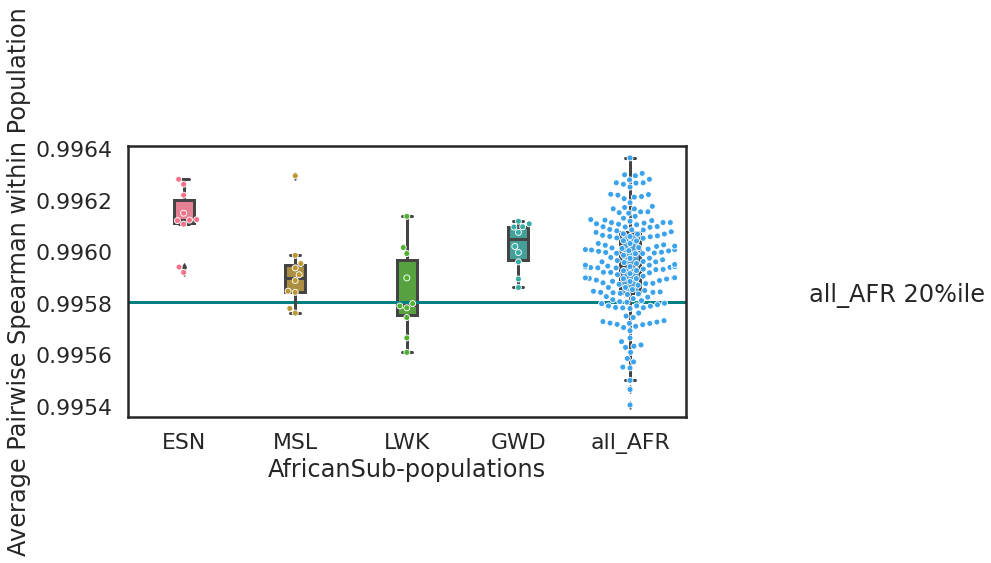

ESN avg: 0.9961260971482719
MSL avg: 0.995921875943257
LWK avg: 0.9958452606137655
GWD avg: 0.9960243145367491
all_AFR avg: 0.9959532222359919
all_AFR 20%ile: 0.9958074836711539


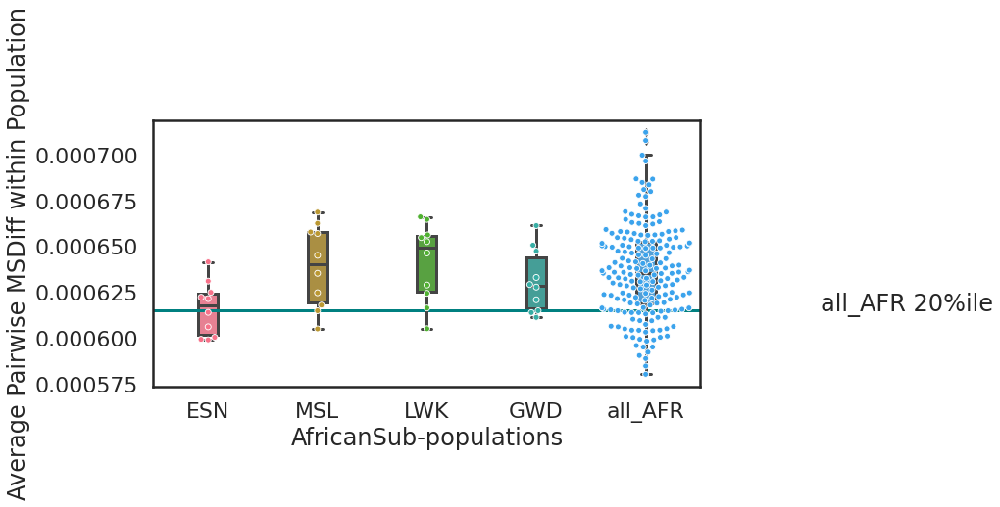

ESN avg: 0.000616235297607197
MSL avg: 0.0006391083118439836
LWK avg: 0.0006417698797393667
GWD avg: 0.0006312428128268449
all_AFR avg: 0.0006364511742179702
all_AFR 20%ile: 0.000615115316909147


In [40]:
afr_spears, afr_mses = make_metrics_dict(afr_pops, 'AFR')
plot_subpop_avgs(afr_spears, 'all_AFR', 'African', 'Spearman')
plot_subpop_avgs(afr_mses, 'all_AFR', 'African', 'MSDiff')

In [45]:
type(pairs_20afr_spearman)

pandas.core.frame.DataFrame

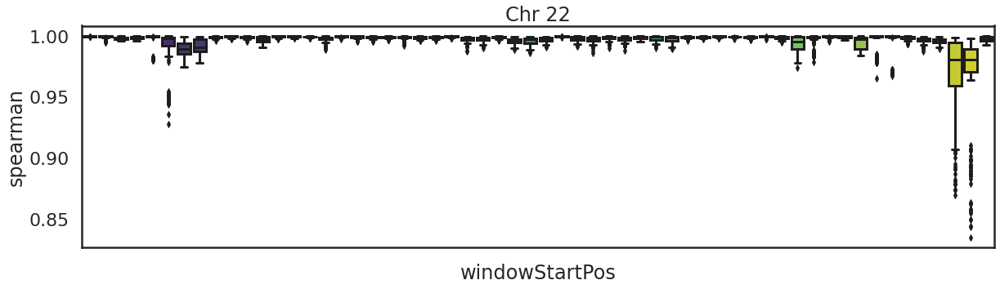

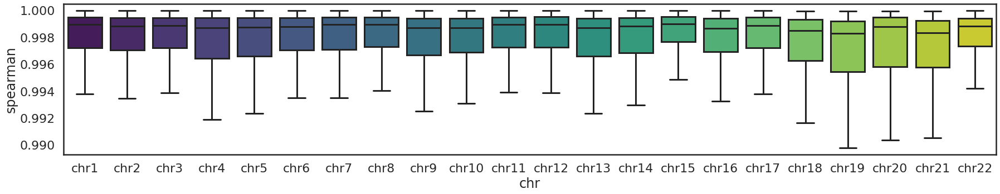

In [53]:
mean_vals_one_chr('chr22','spearman', pairs_20afr_spearman)
mean_vals_all_chr('spearman',pairs_20afr_spearman)

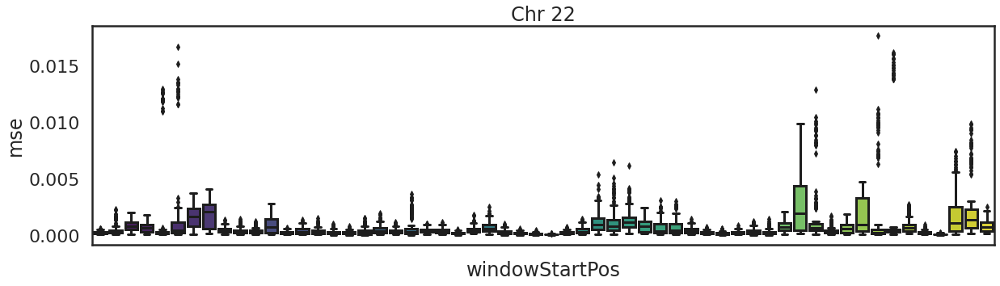

In [69]:
mean_vals_one_chr('chr22','mse', pairs_20afr_mse)

## EAS

/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 45.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


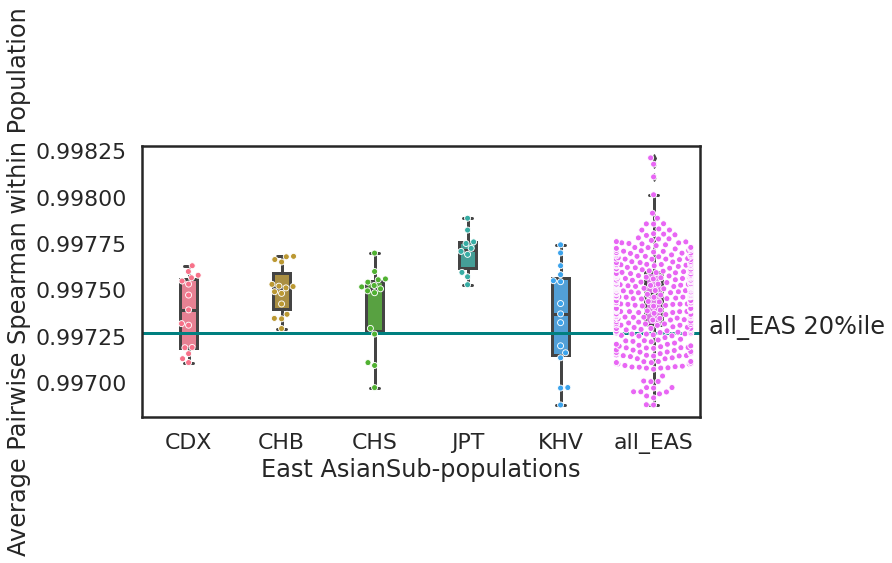

CDX avg: 0.9973821199564993
CHB avg: 0.9975010384798819
CHS avg: 0.9974147750201454
JPT avg: 0.9977048579906471
KHV avg: 0.9973466869208781
all_EAS avg: 0.9974508897243171
all_EAS 20%ile: 0.9972658997422537


/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 50.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


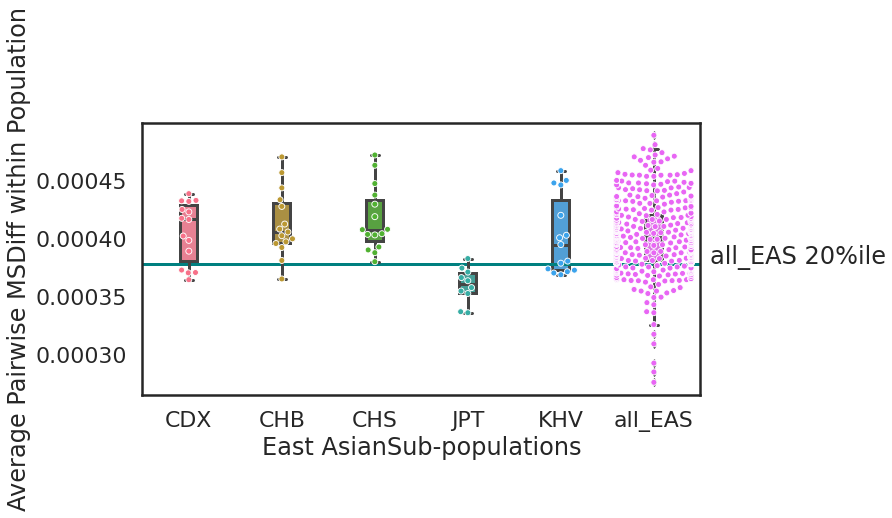

CDX avg: 0.0004056381688043385
CHB avg: 0.00041266524231216376
CHS avg: 0.0004162448611316689
JPT avg: 0.00035964832377506905
KHV avg: 0.00040239439960439876
all_EAS avg: 0.0004019430506791274
all_EAS 20%ile: 0.0003781153033904891


In [54]:
eas_spears, eas_mses = make_metrics_dict(eas_pops, 'EAS')
plot_subpop_avgs(eas_spears, 'all_EAS', 'East Asian', 'Spearman')
plot_subpop_avgs(eas_mses, 'all_EAS', 'East Asian', 'MSDiff')

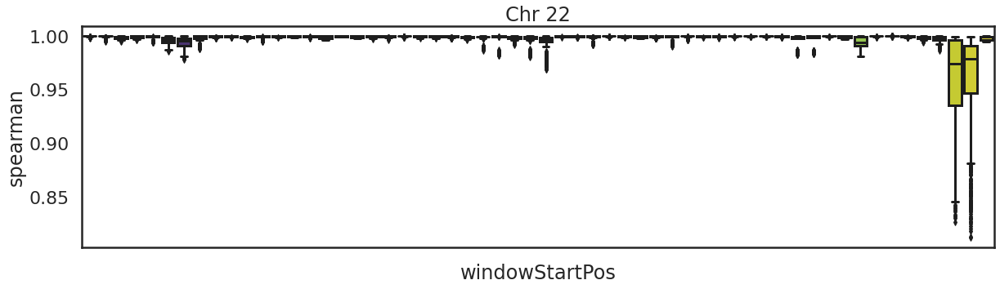

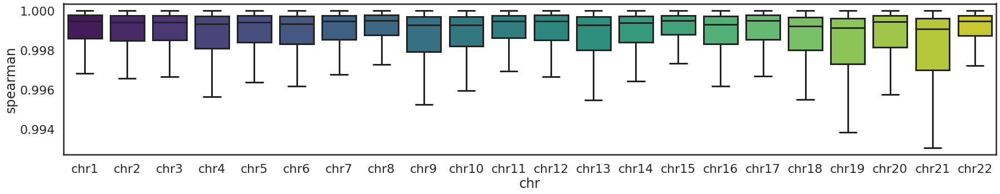

In [55]:
mean_vals_one_chr('chr22','spearman', pairs_eas_spearman)
mean_vals_all_chr('spearman',pairs_eas_spearman)

## EUR

/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 38.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


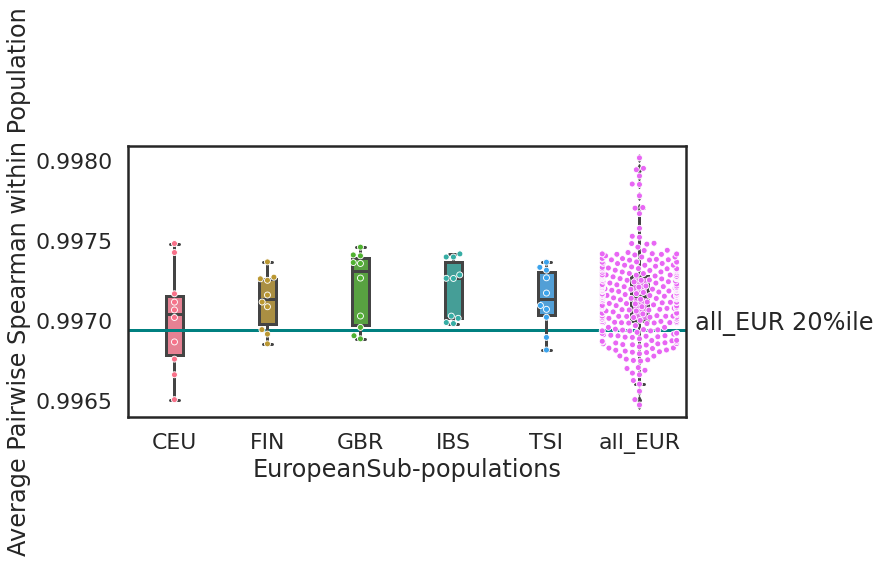

CEU avg: 0.9970109122472179
FIN avg: 0.9971265898139429
GBR avg: 0.9972074827300836
IBS avg: 0.997207373212224
TSI avg: 0.9971387718920031
all_EUR avg: 0.9971458809833144
all_EUR 20%ile: 0.9969474027315954


/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 45.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


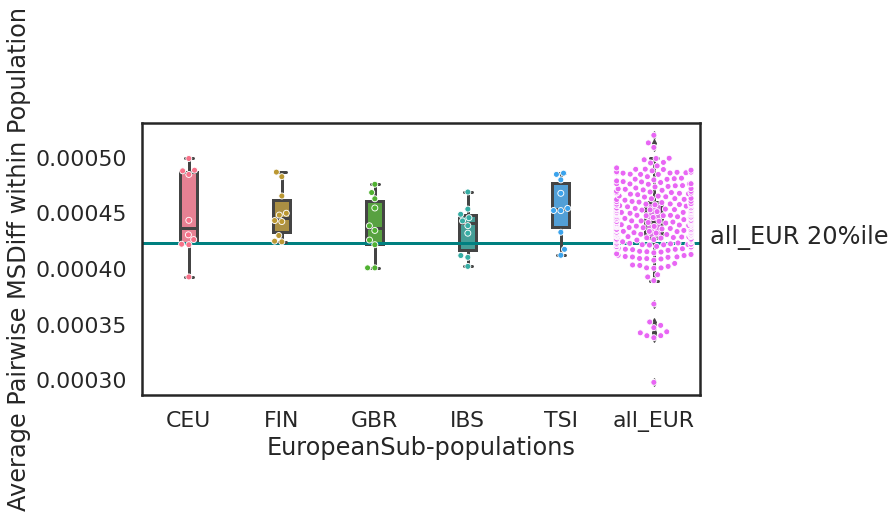

CEU avg: 0.0004494228233206279
FIN avg: 0.00044951027746260484
GBR avg: 0.00043812679035668326
IBS avg: 0.0004352780546651688
TSI avg: 0.0004536868595827194
all_EUR avg: 0.0004421070103666355
all_EUR 20%ile: 0.0004224926695250077


In [56]:
eur_spears, eur_mses = make_metrics_dict(eur_pops, 'EUR')
plot_subpop_avgs(eur_spears, 'all_EUR', 'European', 'Spearman')
plot_subpop_avgs(eur_mses, 'all_EUR', 'European', 'MSDiff')

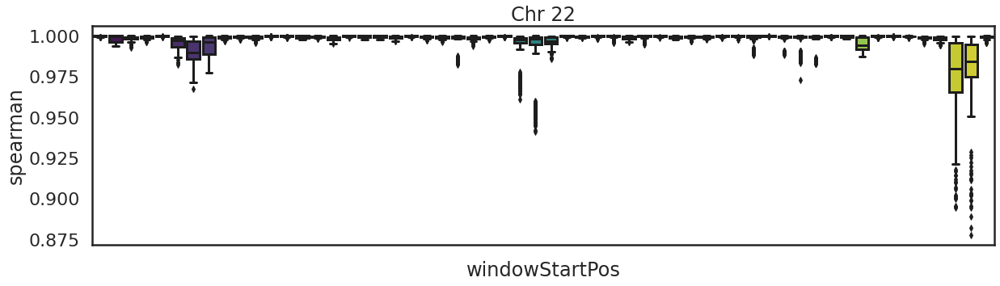

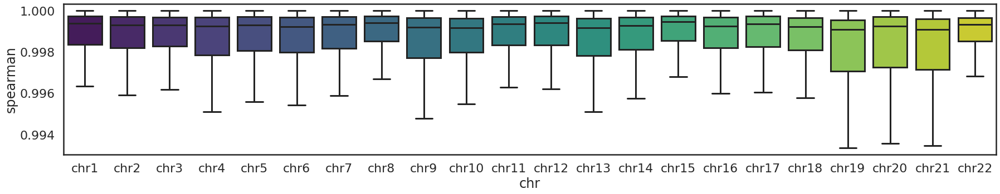

In [57]:
mean_vals_one_chr('chr22','spearman', pairs_eur_spearman)
mean_vals_all_chr('spearman',pairs_eur_spearman)

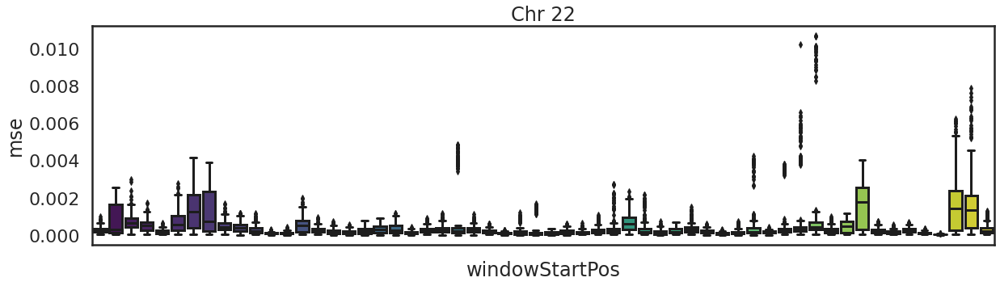

In [68]:
mean_vals_one_chr('chr22','mse', pairs_eur_mse)

## AMR

/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 22.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


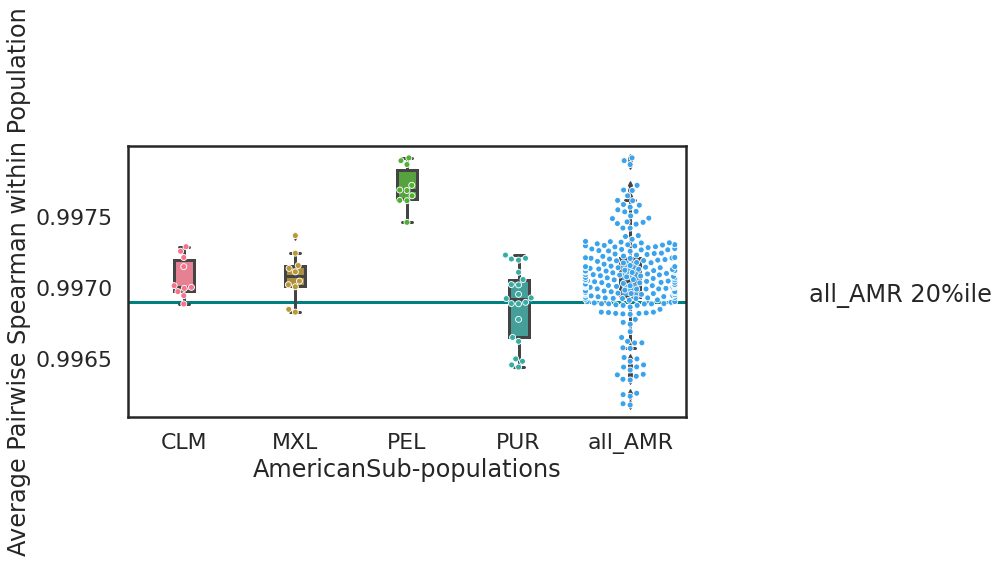

CLM avg: 0.99707111724878
MXL avg: 0.9970754556623918
PEL avg: 0.9977077944964436
PUR avg: 0.9968779233891922
all_AMR avg: 0.9970537050957267
all_AMR 20%ile: 0.9968966082926022


/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 27.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


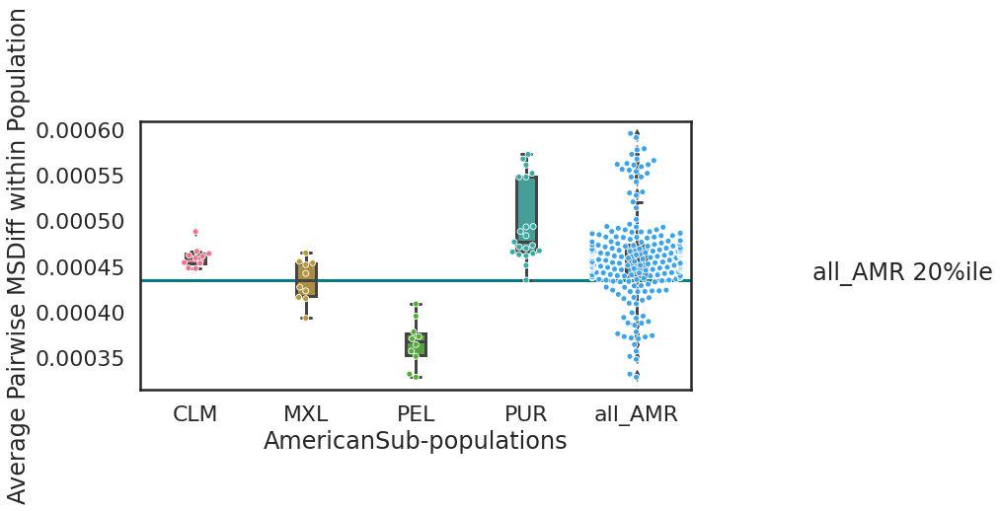

CLM avg: 0.00046064116669046153
MXL avg: 0.00043442411505540497
PEL avg: 0.00036613534438323646
PUR avg: 0.0004957818455206987
all_AMR avg: 0.00045934761008366374
all_AMR 20%ile: 0.00043514815558035817


In [58]:
amr_spears, amr_mses = make_metrics_dict(amr_pops, 'AMR')
plot_subpop_avgs(amr_spears, 'all_AMR', 'American', 'Spearman')
plot_subpop_avgs(amr_mses, 'all_AMR', 'American', 'MSDiff')

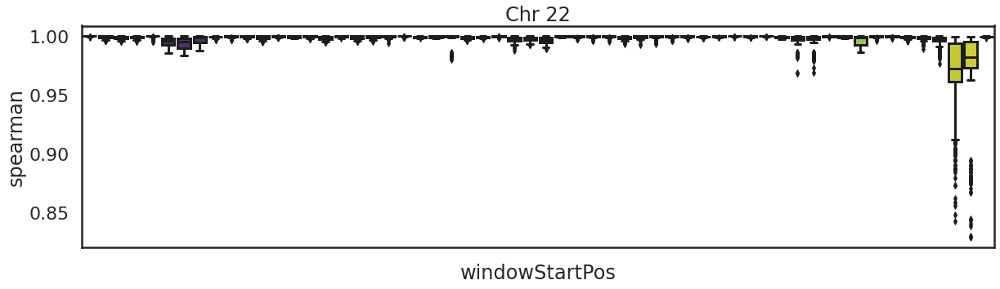

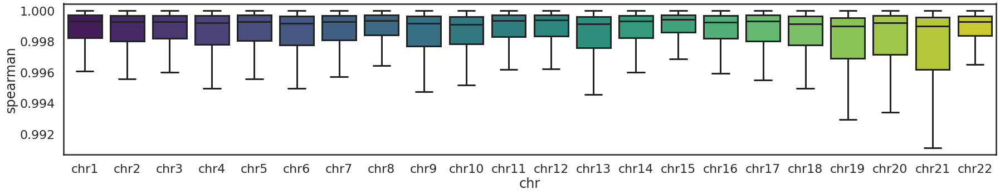

In [59]:
mean_vals_one_chr('chr22','spearman', pairs_amr_spearman)
mean_vals_all_chr('spearman',pairs_amr_spearman)

## SAS

/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 29.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


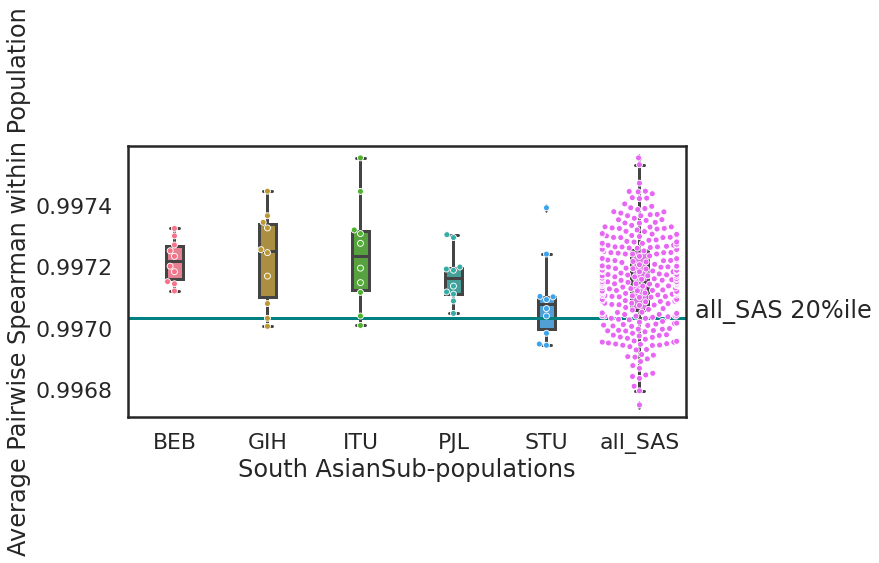

BEB avg: 0.9972194955512107
GIH avg: 0.9972282104134207
ITU avg: 0.9972421603016098
PJL avg: 0.9971693499470721
STU avg: 0.9970924463631796
all_SAS avg: 0.9971553502889299
all_SAS 20%ile: 0.9970361130456398


/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/seaborn/categorical.py:1296: UserWarning: 28.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


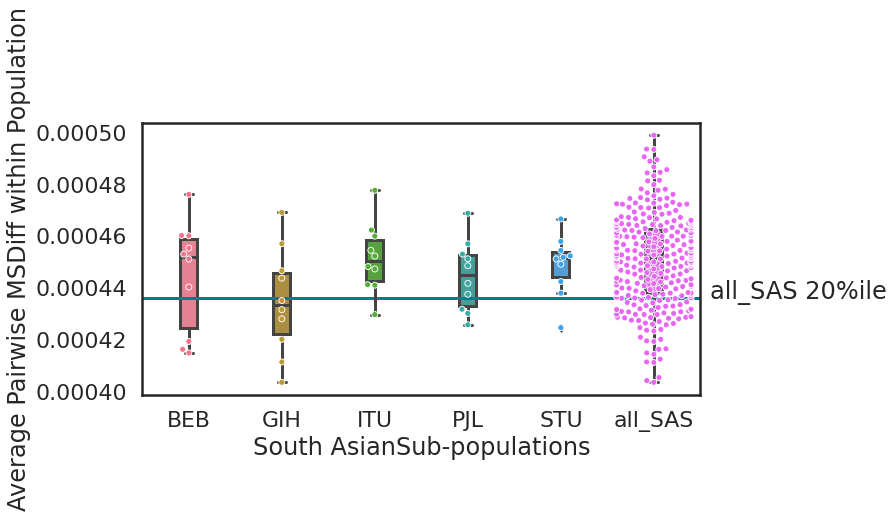

BEB avg: 0.00044467260673585726
GIH avg: 0.0004346475268053915
ITU avg: 0.00045141994577452835
PJL avg: 0.0004445574649932289
STU avg: 0.0004488513164280344
all_SAS avg: 0.000450709484600212
all_SAS 20%ile: 0.00043596607633570076


In [60]:
sas_spears, sas_mses = make_metrics_dict(sas_pops, 'SAS')
plot_subpop_avgs(sas_spears, 'all_SAS', 'South Asian', 'Spearman')
plot_subpop_avgs(sas_mses, 'all_SAS', 'South Asian', 'MSDiff')

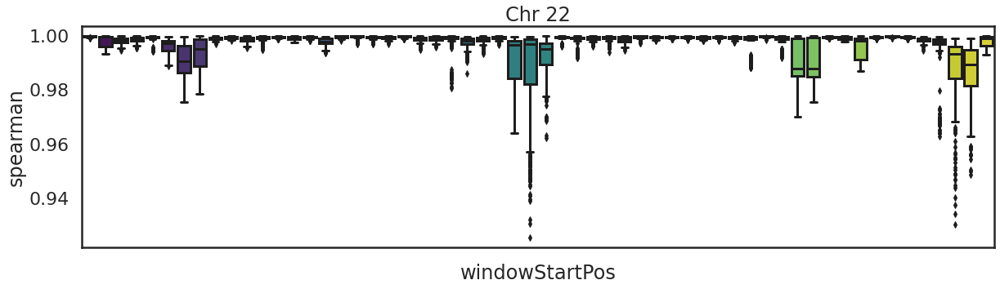

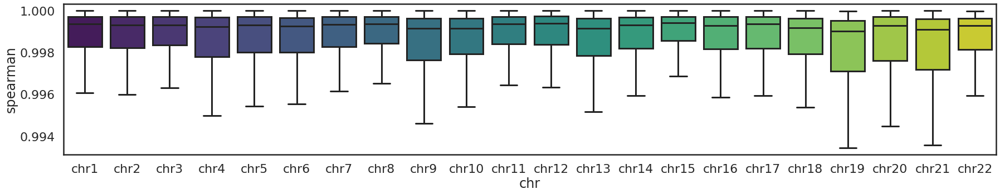

In [61]:
mean_vals_one_chr('chr22','spearman', pairs_sas_spearman)
mean_vals_all_chr('spearman',pairs_sas_spearman)

## All super pops

### setup

In [62]:
super_spears = {'AFR':afr_spears['all_AFR'],
                'EUR':eur_spears['all_EUR'],
                'EAS':eas_spears['all_EAS'],
                'SAS':sas_spears['all_SAS'],
                'AMR':amr_spears['all_AMR']}

super_mses = {'AFR':afr_mses['all_AFR'],
                'EUR':eur_mses['all_EUR'],
                'EAS':eas_mses['all_EAS'],
                'SAS':sas_mses['all_SAS'],
                'AMR':amr_mses['all_AMR']}

In [63]:
stats.kruskal(afr_mses['all_AFR'], eur_mses['all_EUR'],eas_mses['all_EAS'],sas_mses['all_SAS'],amr_mses['all_AMR'] )

KruskalResult(statistic=851.8238084864342, pvalue=4.561928511859785e-183)

In [64]:
df = pd.DataFrame(columns=['Population','AVG_MSD'])
for pop in super_mses:
    data = super_mses[pop]
    names = [pop]*len(data)
    temp = pd.DataFrame(list(zip(names,data)), columns = ['Population','AVG_MSD'])
    df = pd.concat([df, temp])

In [65]:
df

,Population,AVG_MSD
0,AFR,0.000657
1,AFR,0.000618
2,AFR,0.000645
3,AFR,0.000625
4,AFR,0.000641
...,...,...
226,AMR,0.000332
227,AMR,0.000365
228,AMR,0.000378
229,AMR,0.000373


In [66]:
sp.posthoc_conover(df, val_col='AVG_MSD', group_col='Population', p_adjust = 'holm')

,AFR,AMR,EAS,EUR,SAS
AFR,1.000000e+00,6.096282e-74,3.038552e-270,2.195927e-123,2.428998e-92
AMR,6.096282e-74,1.000000e+00,7.909533e-109,3.857983e-09,9.567747e-02
EAS,3.038552e-270,7.909533e-109,1.000000e+00,1.895201e-73,1.895724e-109
EUR,2.195927e-123,3.857983e-09,1.895201e-73,1.000000e+00,4.211747e-06
SAS,2.428998e-92,9.567747e-02,1.895724e-109,4.211747e-06,1.000000e+00


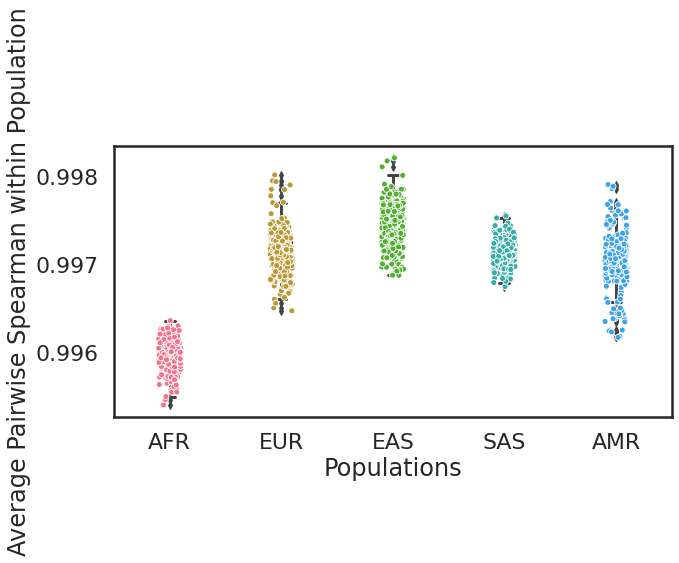

AFR avg: 0.9959532222359919
EUR avg: 0.9971458809833144
EAS avg: 0.9974508897243171
SAS avg: 0.9971553502889299
AMR avg: 0.9970537050957267


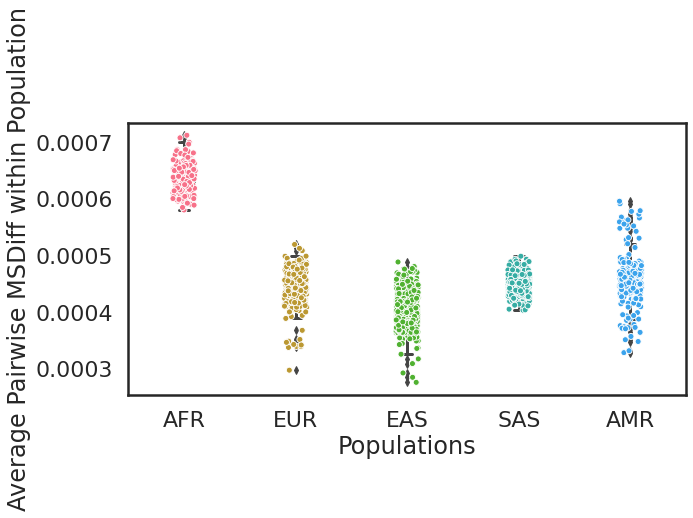

AFR avg: 0.0006364511742179702
EUR avg: 0.0004421070103666355
EAS avg: 0.0004019430506791274
SAS avg: 0.000450709484600212
AMR avg: 0.00045934761008366374


In [585]:
plot_super_means(super_spears, 'Spearman')
plot_super_means(super_mses, 'MSDiff')

In [530]:
sorted(super_mses['AFR'], reverse=True)

[0.0007123391510330641,
 0.0007078882989385303,
 0.0006999408208856571,
 0.0006967326586497117,
 0.0006870144861725199,
 0.0006868888710415055,
 0.0006850441962110816,
 0.0006837735763310111,
 0.0006811828616309601,
 0.0006800939701874758,
 0.0006781439237305945,
 0.0006774035948330049,
 0.0006733710365077203,
 0.0006709072766696477,
 0.0006691421151716292,
 0.0006688614916197921,
 0.0006676596624542697,
 0.0006673537976199983,
 0.0006668756303910983,
 0.0006662803054696469,
 0.0006661954804991411,
 0.0006648937557645837,
 0.0006636536468140026,
 0.0006632405065928943,
 0.0006627409442302353,
 0.0006623747962142921,
 0.000661521177479661,
 0.0006594123467532088,
 0.0006591146826751312,
 0.0006587180947952382,
 0.0006583271650282234,
 0.0006583005898766827,
 0.0006580455485765772,
 0.0006573604549216245,
 0.0006572399274283248,
 0.0006568534844670358,
 0.0006564760330613241,
 0.0006564365135833234,
 0.0006562323068919036,
 0.0006550296487180198,
 0.0006549959352563885,
 0.00065468367986

# Between Populations

## For Conklin meeting

### PopSummaries

In [76]:
for i in afr_20:
    for j in eur:
        

In [80]:
def pairs_df_cross_pop(pop1,pop2):
    pairs_spearman = pd.DataFrame([])
    pairs_mse = pd.DataFrame([])
    comps = []
    missing = []
    for i1 in pop1:
        for i2 in pop2:
            name1 = (i1 + '_VS_' + i2)
            key1 = (i1,i2)
            if key1 in pairs.keys() and name1 not in comps:
                pair = pairs[key1]
                pair = pair[pair.chr != 'chrX']
                pair_sp = regionsToKeep.merge(pair, how='inner',on=['chr','windowStartPos'])[['chr','windowStartPos','spearman']] # only keep windows with full coverage in 1kg
                pair_sp.columns = ['chr','windowStartPos',name1]

                pair_mse = regionsToKeep.merge(pair, how='inner',on=['chr','windowStartPos'])[['chr','windowStartPos','mse']] # only keep windows with full coverage in 1kg
                pair_mse.columns = ['chr','windowStartPos',name1]
                if pairs_spearman.empty:
                     pairs_spearman = pair_sp
                else:
                    pairs_spearman = pairs_spearman.merge(pair_sp, on=['chr','windowStartPos'])
                if pairs_mse.empty:
                     pairs_mse = pair_mse
                else:
                    pairs_mse = pairs_mse.merge(pair_mse, on=['chr','windowStartPos'])
                comps.append(name1)
            else:
                missing.append([i1,i2])
    return pairs_spearman, pairs_mse, comps, missing

In [81]:
pairs_AFRtoEUR_spearman,pairs_AFRtoEUR_mse,afr_eurComps,missing_AFRtoEUR = pairs_df_cross_pop(afr_20,eur)

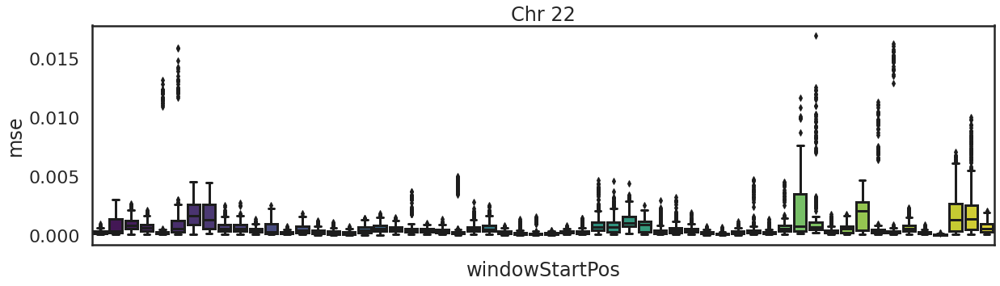

In [82]:
mean_vals_one_chr('chr22','mse', pairs_AFRtoEUR_mse)

In [225]:
pairs_AFRtoEUR_mse[pairs_AFRtoEUR_mse.chr =='chr22']

,chr,windowStartPos,AFR_MSL_female_HG03086_VS_EUR_CEU_female_NA12006,AFR_MSL_female_HG03086_VS_EUR_FIN_female_HG00285,AFR_MSL_female_HG03086_VS_EUR_GBR_female_HG00261,AFR_MSL_female_HG03086_VS_EUR_IBS_female_HG01519,AFR_MSL_female_HG03086_VS_EUR_TSI_female_NA20795,AFR_MSL_female_HG03086_VS_EUR_IBS_female_HG01773,AFR_MSL_female_HG03086_VS_EUR_IBS_female_HG01516,AFR_MSL_female_HG03086_VS_EUR_IBS_female_HG01632,...,AFR_ESN_female_HG02922_VS_EUR_FIN_female_HG00304,AFR_ESN_female_HG02922_VS_EUR_FIN_female_HG00344,AFR_ESN_female_HG02922_VS_EUR_TSI_female_NA20821,AFR_ESN_female_HG02922_VS_EUR_GBR_female_HG00231,AFR_ESN_female_HG02922_VS_EUR_TSI_female_NA20508,AFR_ESN_female_HG02922_VS_EUR_TSI_female_NA20797,AFR_ESN_female_HG02922_VS_EUR_TSI_female_NA20771,AFR_ESN_female_HG02922_VS_EUR_GBR_female_HG00106,AFR_ESN_female_HG02922_VS_EUR_GBR_female_HG00122,AFR_ESN_female_HG02922_VS_EUR_GBR_female_HG00099
4691,chr22,17301504,0.000110,0.000189,0.000319,0.000185,0.000205,0.000253,0.000327,0.000227,...,0.000593,0.000264,0.000729,0.000204,0.000281,0.000412,0.000292,0.000146,0.000318,0.000194
4692,chr22,17825792,0.001721,0.001659,0.001887,0.001595,0.001602,0.001681,0.000136,0.001306,...,0.000430,0.001736,0.000615,0.000396,0.001255,0.001652,0.000338,0.000435,0.000457,0.001530
4693,chr22,19398656,0.001265,0.001336,0.000895,0.000875,0.001283,0.000945,0.001025,0.001555,...,0.002077,0.002343,0.000644,0.001539,0.000746,0.000782,0.001124,0.000760,0.000603,0.000944
4694,chr22,20971520,0.000546,0.000569,0.000599,0.001068,0.000894,0.001032,0.000670,0.001456,...,0.000096,0.000633,0.000560,0.000589,0.001428,0.000611,0.001097,0.000871,0.000476,0.000607
4695,chr22,21495808,0.000177,0.000309,0.000191,0.000305,0.000318,0.000207,0.000221,0.000264,...,0.000203,0.000175,0.000205,0.000261,0.000218,0.000252,0.000319,0.000296,0.000360,0.000194
4696,chr22,22020096,0.000433,0.001135,0.000944,0.000521,0.000492,0.000259,0.000411,0.000574,...,0.002812,0.001982,0.001613,0.003020,0.001535,0.000357,0.000086,0.001659,0.002361,0.002126
4697,chr22,22544384,0.001005,0.002709,0.003701,0.000490,0.000428,0.000541,0.000230,0.000367,...,0.001839,0.000409,0.001908,0.000782,0.000333,0.001630,0.000141,0.002173,0.000423,0.002054
4698,chr22,23068672,0.000175,0.002497,0.003170,0.000227,0.000177,0.000187,0.000525,0.000202,...,0.001985,0.000280,0.002717,0.000324,0.000168,0.002066,0.000278,0.002625,0.000269,0.002387
4699,chr22,23592960,0.000755,0.000806,0.000783,0.000968,0.000844,0.001348,0.000770,0.000736,...,0.000191,0.000256,0.000209,0.000353,0.000337,0.000448,0.000531,0.000224,0.001169,0.000284
4700,chr22,24117248,0.000769,0.000708,0.000840,0.000842,0.000851,0.001310,0.000306,0.000645,...,0.000694,0.000384,0.000528,0.000730,0.000654,0.000926,0.000845,0.000667,0.001593,0.000680


In [182]:
chr22 = pairs_AFRtoEUR_mse[pairs_AFRtoEUR_mse.chr =='chr22']
chr22=chr22.set_index('windowStartPos').drop(columns=['chr'])
chr22['max@pos'] = chr22.max(axis=1)
chr22['max_pair']=chr22.idxmax(axis=1)
chr22 = chr22.sort_values(by='max@pos', ascending=False)
max_diff22 = chr22.head(10)

In [183]:
max_diff22

,AFR_MSL_female_HG03086_VS_EUR_CEU_female_NA12006,AFR_MSL_female_HG03086_VS_EUR_FIN_female_HG00285,AFR_MSL_female_HG03086_VS_EUR_GBR_female_HG00261,AFR_MSL_female_HG03086_VS_EUR_IBS_female_HG01519,AFR_MSL_female_HG03086_VS_EUR_TSI_female_NA20795,AFR_MSL_female_HG03086_VS_EUR_IBS_female_HG01773,AFR_MSL_female_HG03086_VS_EUR_IBS_female_HG01516,AFR_MSL_female_HG03086_VS_EUR_IBS_female_HG01632,AFR_MSL_female_HG03086_VS_EUR_IBS_female_HG01668,AFR_MSL_female_HG03086_VS_EUR_CEU_female_NA12717,...,AFR_ESN_female_HG02922_VS_EUR_TSI_female_NA20821,AFR_ESN_female_HG02922_VS_EUR_GBR_female_HG00231,AFR_ESN_female_HG02922_VS_EUR_TSI_female_NA20508,AFR_ESN_female_HG02922_VS_EUR_TSI_female_NA20797,AFR_ESN_female_HG02922_VS_EUR_TSI_female_NA20771,AFR_ESN_female_HG02922_VS_EUR_GBR_female_HG00106,AFR_ESN_female_HG02922_VS_EUR_GBR_female_HG00122,AFR_ESN_female_HG02922_VS_EUR_GBR_female_HG00099,max@pos,max_pair
windowStartPos,,,,,,,,,,,,,,,,,,,,,
43515904,0.000806,0.000633,0.000557,0.000489,0.000743,0.001008,0.000525,0.001277,0.001127,0.000458,...,0.000267,0.000460,0.000402,0.009669,0.000429,0.000589,0.000428,0.000390,0.016939,AFR_MSL_female_HG03212_VS_EUR_TSI_female_NA20797
46137344,0.000185,0.000199,0.000133,0.000248,0.000196,0.000188,0.000129,0.000174,0.000128,0.000200,...,0.000260,0.000240,0.000092,0.000294,0.000097,0.000202,0.000197,0.000140,0.016233,AFR_ESN_female_HG03105_VS_EUR_TSI_female_NA20508
22020096,0.000433,0.001135,0.000944,0.000521,0.000492,0.000259,0.000411,0.000574,0.000998,0.000165,...,0.001613,0.003020,0.001535,0.000357,0.000086,0.001659,0.002361,0.002126,0.015925,AFR_ESN_female_HG03514_VS_EUR_FIN_female_HG00285
21495808,0.000177,0.000309,0.000191,0.000305,0.000318,0.000207,0.000221,0.000264,0.000285,0.000186,...,0.000205,0.000261,0.000218,0.000252,0.000319,0.000296,0.000360,0.000194,0.013153,AFR_ESN_female_HG03514_VS_EUR_IBS_female_HG01516
42991616,0.003329,0.003607,0.003313,0.003471,0.003159,0.003374,0.003270,0.002951,0.003641,0.003216,...,0.000382,0.004362,0.000259,0.005919,0.000232,0.000186,0.000178,0.000193,0.011621,AFR_MSL_female_HG03212_VS_EUR_TSI_female_NA20797
45613056,0.000488,0.000399,0.000398,0.000378,0.000324,0.000358,0.000388,0.000539,0.000155,0.000174,...,0.009336,0.009817,0.008706,0.009051,0.010493,0.009667,0.008949,0.010429,0.011332,AFR_ESN_female_HG02922_VS_EUR_CEU_female_NA12749
48758784,0.000180,0.002631,0.002523,0.002382,0.002280,0.005166,0.002536,0.000377,0.000398,0.000165,...,0.000482,0.000244,0.000516,0.003113,0.000517,0.002619,0.000311,0.002837,0.010016,AFR_ESN_female_HG03499_VS_EUR_IBS_female_HG01516
48234496,0.000115,0.002560,0.003657,0.003040,0.002618,0.005002,0.002547,0.000206,0.000604,0.000113,...,0.000532,0.000232,0.000359,0.004135,0.000236,0.003260,0.000643,0.004077,0.007056,AFR_GWD_female_HG03539_VS_EUR_IBS_female_HG01773
31457280,0.000181,0.000215,0.000219,0.000254,0.000229,0.000054,0.004485,0.000116,0.000109,0.000161,...,0.000480,0.000121,0.000376,0.004166,0.000149,0.000173,0.000191,0.000388,0.005011,AFR_LWK_female_NA19019_VS_EUR_IBS_female_HG01516


In [272]:
indivs = list(max_diff22.max_pair)
indivs = [tuple(map(str, sub.split('_VS_'))) for sub in indivs]
indivs

[('AFR_MSL_female_HG03212', 'EUR_TSI_female_NA20797'),
 ('AFR_ESN_female_HG03105', 'EUR_TSI_female_NA20508'),
 ('AFR_ESN_female_HG03514', 'EUR_FIN_female_HG00285'),
 ('AFR_ESN_female_HG03514', 'EUR_IBS_female_HG01516'),
 ('AFR_MSL_female_HG03212', 'EUR_TSI_female_NA20797'),
 ('AFR_ESN_female_HG02922', 'EUR_CEU_female_NA12749'),
 ('AFR_ESN_female_HG03499', 'EUR_IBS_female_HG01516'),
 ('AFR_GWD_female_HG03539', 'EUR_IBS_female_HG01773'),
 ('AFR_LWK_female_NA19019', 'EUR_IBS_female_HG01516'),
 ('AFR_MSL_female_HG03085', 'EUR_CEU_female_NA12717')]

In [273]:
locs = list(max_diff22.index)
chrm = 'chr22'

('AFR_MSL_female_HG03212', 'EUR_TSI_female_NA20797')
43515904
('AFR_ESN_female_HG03105', 'EUR_TSI_female_NA20508')
46137344
('AFR_ESN_female_HG03514', 'EUR_FIN_female_HG00285')
22020096
('AFR_ESN_female_HG03514', 'EUR_IBS_female_HG01516')
21495808
('AFR_MSL_female_HG03212', 'EUR_TSI_female_NA20797')
42991616
('AFR_ESN_female_HG02922', 'EUR_CEU_female_NA12749')
45613056
('AFR_ESN_female_HG03499', 'EUR_IBS_female_HG01516')
48758784
('AFR_GWD_female_HG03539', 'EUR_IBS_female_HG01773')
48234496
('AFR_LWK_female_NA19019', 'EUR_IBS_female_HG01516')
31457280
('AFR_MSL_female_HG03085', 'EUR_CEU_female_NA12717')
41418752


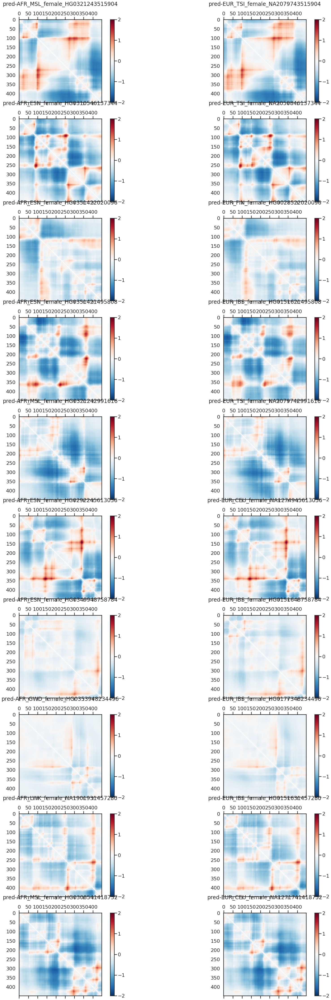

In [214]:
plt.subplots(10,2,figsize=(30,80))
vmin=-2; vmax=2
subplt= np.array([1,2])
for comp in range(len(locs)):
    print(indivs[comp])
    print(locs[comp])
    afr_ind = indivs[comp][0]
    eur_ind = indivs[comp][1]
    start = locs[comp]
    afr_pred = extractFastaRunAkita(afr_ind,chrm,start).pred
    eur_pred = extractFastaRunAkita(eur_ind,chrm,start).pred

    afr_mat = from_upper_triu(afr_pred, target_length1_cropped, hic_diags)
    eur_mat = from_upper_triu(eur_pred, target_length1_cropped, hic_diags)
    pair_of_plots(afr_mat, eur_mat, str(afr_ind + str(start)), str(eur_ind + str(start)), subplt, 10)
    subplt += 2

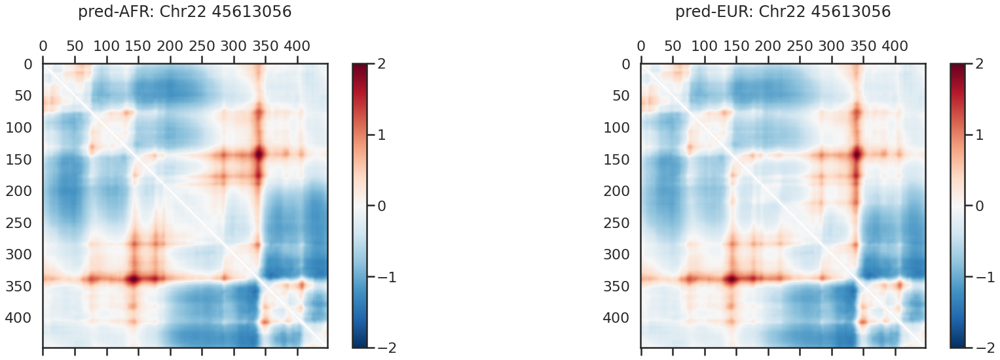

In [274]:
plt.subplots(1,2,figsize=(30,8))
vmin=-2; vmax=2
subplt= np.array([1,2])
afr_ind = indivs[5][0]
eur_ind = indivs[5][1]
start = locs[5]
afr_pred = extractFastaRunAkita(afr_ind,chrm,start).pred
eur_pred = extractFastaRunAkita(eur_ind,chrm,start).pred

afr_mat = from_upper_triu(afr_pred, target_length1_cropped, hic_diags)
eur_mat = from_upper_triu(eur_pred, target_length1_cropped, hic_diags)
pair_of_plots(afr_mat, eur_mat, str('AFR: Chr22 ' + str(start)), str('EUR: Chr22 ' + str(start)), subplt, 1)

### Chosen for presentation

In [275]:
afr_ind = indivs[5][0]
eur_ind = indivs[5][1]
start = locs[5]
afr_pred = extractFastaRunAkita(afr_ind,chrm,start).pred
eur_pred = extractFastaRunAkita(eur_ind,chrm,start).pred

afr_mat = from_upper_triu(afr_pred, target_length1_cropped, hic_diags)
eur_mat = from_upper_triu(eur_pred, target_length1_cropped, hic_diags)

In [276]:
def from_upper_triu_combo(vec1, vec2, matrix_len, num_diags):
    z = np.zeros((matrix_len,matrix_len))
    x = np.zeros((matrix_len,matrix_len))
    triu_tup = np.triu_indices(matrix_len,num_diags)
    z[triu_tup] = vec1
    x[triu_tup] = vec2
    for i in range(-num_diags+1,num_diags):
        set_diag(z, np.nan, i)
        set_diag(x, np.nan, i)
    return z + x.T

In [277]:
combo_mat = from_upper_triu_combo(afr_pred, eur_pred, target_length1_cropped, hic_diags)

In [278]:
start

45613056

Text(0, 0.5, 'EUR')

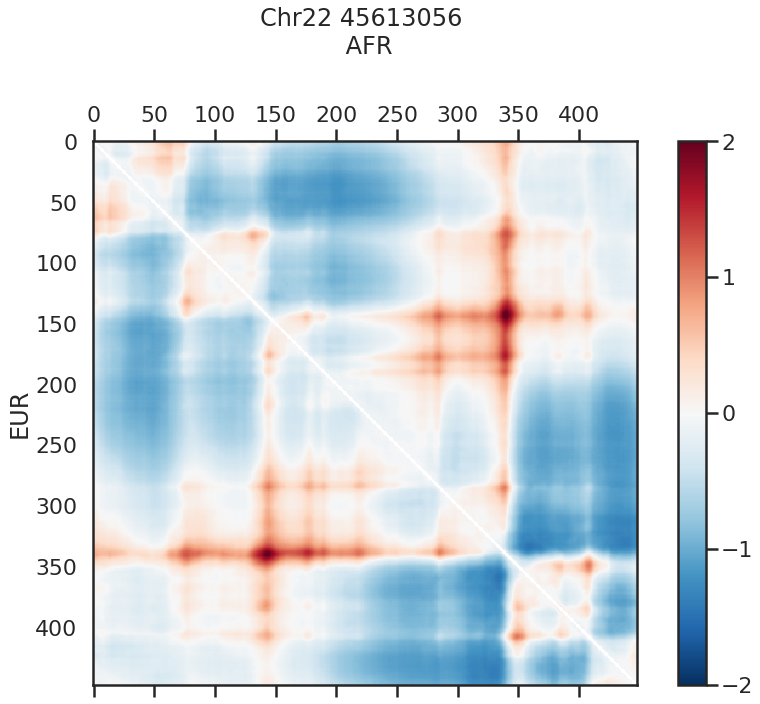

In [281]:
name = 'Chr22 45613056 \n AFR'

plt.figure(figsize=(15,10))
vmin=-2; vmax=2
im = plt.matshow(combo_mat, fignum=False, cmap= 'RdBu_r', vmax=vmax, vmin=vmin)
plt.colorbar(im, fraction=.04, pad = 0.05, ticks=[-2,-1, 0, 1,2]);
plt.title(name,y=1.15 )
plt.ylabel('EUR')

### NEFL

In [311]:
gene_start = 24808468
gene_end = 24814126
flank = (2**20 - (gene_end - gene_start))/2
start = gene_start - flank
end = gene_end + flank
chrm = 'chr8'
afr_ind = indivs[5][0]
eur_ind = indivs[5][1]
afr_pred = extractFastaRunAkita(afr_ind,chrm,start, end).pred
eur_pred = extractFastaRunAkita(eur_ind,chrm,start, end).pred

afr_mat = from_upper_triu(afr_pred, target_length1_cropped, hic_diags)
eur_mat = from_upper_triu(eur_pred, target_length1_cropped, hic_diags)

combo_mat = from_upper_triu_combo(afr_pred, eur_pred, target_length1_cropped, hic_diags)

name = 'Chr8 24287009 \n Centered on NEFL \n AFR'

plt.figure(figsize=(15,10))
vmin=-2; vmax=2
im = plt.matshow(combo_mat, fignum=False, cmap= 'RdBu_r', vmax=vmax, vmin=vmin)
plt.colorbar(im, fraction=.04, pad = 0.05, ticks=[-2,-1, 0, 1,2]);
plt.title(name,y=1.15 )
plt.ylabel('EUR')

Text(0, 0.5, 'EUR')

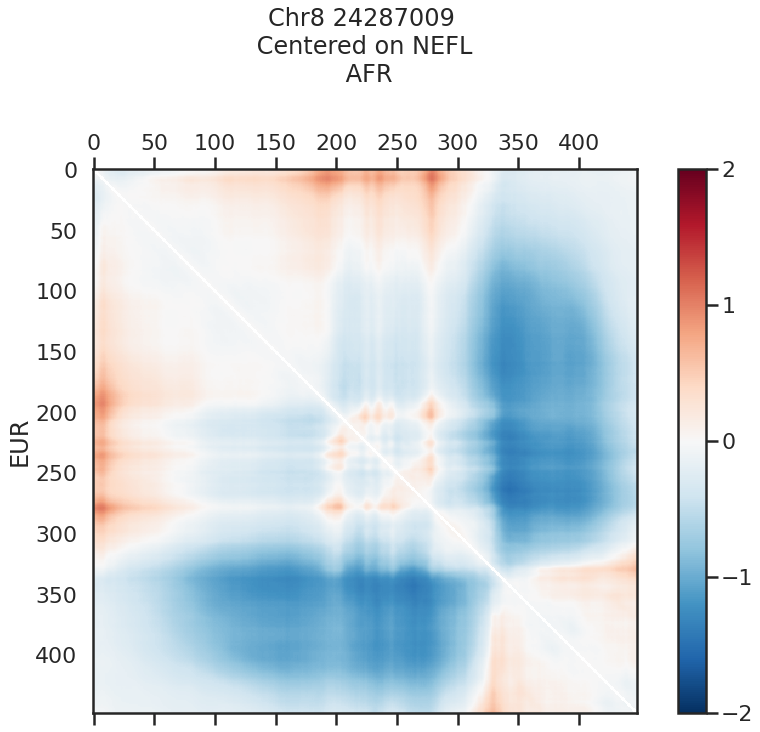

In [339]:
preds = dict.fromkeys(indivs)
for i in indivs:
    print(i)
    preds[i] = extractFastaRunAkita(i,chrm,start, end).pred

AFR_MSL_female_HG03086
AFR_MSL_female_HG03378
AFR_MSL_female_HG03437
AFR_LWK_female_NA19378
AFR_LWK_female_NA19445
AFR_LWK_female_NA19434
AFR_MSL_female_HG03212
AFR_GWD_female_HG03040
AFR_GWD_female_HG03028
AFR_MSL_female_HG03085
AFR_LWK_female_NA19017
AFR_GWD_female_HG03539
AFR_LWK_female_NA19019
AFR_GWD_female_HG03046
AFR_GWD_female_HG03025
AFR_ESN_female_HG03105
AFR_ESN_female_HG03511
AFR_ESN_female_HG03514
AFR_ESN_female_HG03499
AFR_ESN_female_HG02922
AMR_PUR_female_HG00732
AMR_CLM_female_HG01357
AMR_CLM_female_HG01438
AMR_CLM_female_HG01281
AMR_CLM_female_HG01441
AMR_PUR_female_HG01242
AMR_CLM_female_HG01269
AMR_MXL_female_NA19794
AMR_PUR_female_HG01198
AMR_PUR_female_HG01080
AMR_PUR_female_HG01188
AMR_PUR_female_HG01067
AMR_PUR_female_HG00737
AMR_MXL_female_NA19740
AMR_MXL_female_NA19725
AMR_MXL_female_NA19722
AMR_MXL_female_NA19734
AMR_PEL_female_HG02252
AMR_PEL_female_HG01927
AMR_PEL_female_HG01945
AMR_PEL_female_HG01954
AMR_PEL_female_HG01933
EAS_CHB_female_NA18625
EAS_CHB_fem

In [341]:
mats = dict.fromkeys(indivs)
for i in indivs:
    mats[i] = from_upper_triu(preds[i], target_length1_cropped, hic_diags)

In [345]:
mses = dict.fromkeys(pairs.keys())
for pair in pairs.keys():
    i1 = pair[0]
    i2 = pair[1]
    mses[pair] = np.mean(np.square(preds[i1] - preds[i2]))

In [523]:
spears = dict.fromkeys(pairs.keys())
for pair in pairs.keys():
    i1 = pair[0]
    i2 = pair[1]
    spears[pair] = stats.spearmanr(preds[i1], preds[i2])[0]

In [428]:
def make_metrics_dict_one_region(pops_dict, code):
    pop_mses = {}
    for pop in pops_dict.keys():
        pop_mses[pop] = within_pop_mse_one_region(pop, pops_dict)
    all_mse = []
    for pair in pairs:
        if pair[0].split('_')[0] != pair[1].split('_')[0]:
            all_mse.append(mses[pair])
    pop_mses[str('all')] = all_mse
    return pop_mses

In [429]:
def within_pop_mse_one_region(pop, super_pop):
    pop_mse = []
    comp_pairs = []
    for indiv in super_pop[pop]:
        for jndiv in super_pop[pop]:
            if indiv == jndiv:
                pass
            elif [indiv,jndiv] not in comp_pairs and [jndiv,indiv] not in comp_pairs:
                try:
                    pop_mse.append(mses[(indiv,jndiv)])
                    comp_pairs.append([indiv,jndiv])
                except:
                    pop_mse.append(mses[(jndiv,indiv)])
                    comp_pairs.append([jndiv,indiv])

    return pop_mse

In [430]:
mse_dict = make_metrics_dict_one_region(super_pops,'all')

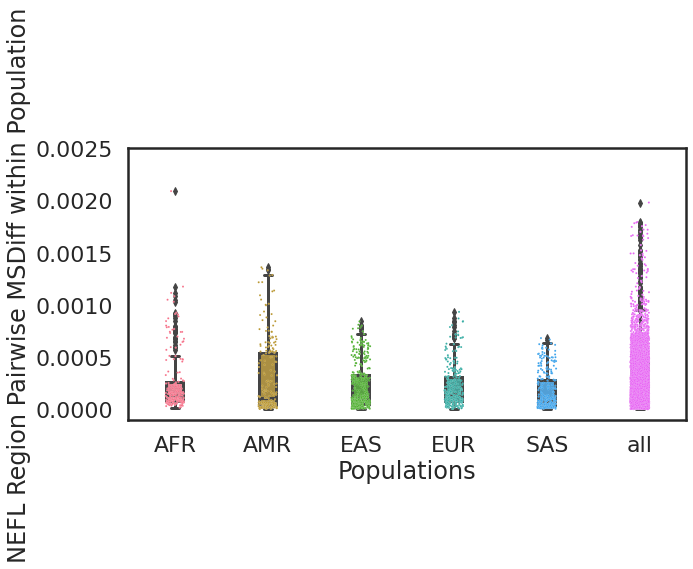

AFR avg: 0.00025818037
AMR avg: 0.0002908582
EAS avg: 0.00021927914
EUR avg: 0.00022215498
SAS avg: 0.00017407248
all avg: 0.00028013514


In [586]:
keys, values = list(mse_dict.keys()), list(mse_dict.values())
#sorted_keys, sorted_vals = zip(*sorted(pop_spears.items(), key=op.itemgetter(1)))
fig, ax = plt.subplots(figsize=[10,5])
sns.stripplot(data=values, size=2, linewidth=.1, edgecolor="white")
sns.boxplot(data=values, width=.18)
ax.set(xlabel=str("Populations"), ylabel=("NEFL Region Pairwise %s within Population" % 'MSDiff') )
plt.ylim(-.0001,.0025)
# category labels
plt.xticks(plt.xticks()[0], keys)
plt.show()
for pop in mse_dict:
    print(pop + ' avg: '+str(np.mean(mse_dict[pop])))

In [458]:
mses[('AFR_ESN_female_HG03105', 'AFR_MSL_female_HG03437')]

0.0020897284

In [587]:
diff_pair = max(mses, key=mses.get)


Text(0, 0.5, 'AFR_MSL_female_HG03437')

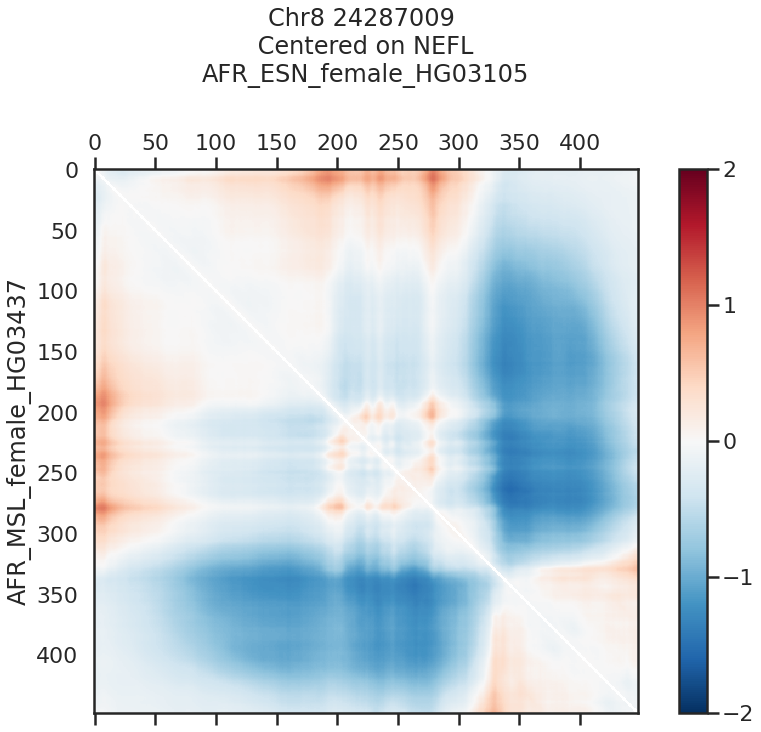

In [460]:
gene_start = 24808468
gene_end = 24814126
flank = (2**20 - (gene_end - gene_start))/2
start = gene_start - flank
end = gene_end + flank
chrm = 'chr8'
ind1 = diff_pair[0]
ind2 = diff_pair[1]
pred1 = extractFastaRunAkita(ind1,chrm,start, end).pred
pred2 = extractFastaRunAkita(ind2,chrm,start, end).pred

mat1 = from_upper_triu(pred1, target_length1_cropped, hic_diags)
mat2 = from_upper_triu(pred2, target_length1_cropped, hic_diags)

combo_mat = from_upper_triu_combo(pred1, pred2, target_length1_cropped, hic_diags)

name = 'Chr8 24287009 \n Centered on NEFL \n' + ind1

plt.figure(figsize=(15,10))
vmin=-2; vmax=2
im = plt.matshow(combo_mat, fignum=False, cmap= 'RdBu_r', vmax=vmax, vmin=vmin)
plt.colorbar(im, fraction=.04, pad = 0.05, ticks=[-2,-1, 0, 1,2]);
plt.title(name,y=1.15 )
plt.ylabel(ind2)

In [524]:
sorted_mses = dict(sorted(mses.items(), key=lambda item: item[1], reverse=True))
sorted_spears = dict(sorted(spears.items(), key=lambda item: item[1], reverse=False))

In [531]:
sorted_mses

{('AFR_ESN_female_HG03105', 'AFR_MSL_female_HG03437'): 0.0020897284,
 ('AFR_ESN_female_HG03105', 'EUR_TSI_female_NA20508'): 0.0019803345,
 ('AFR_ESN_female_HG03105', 'EUR_CEU_female_NA12815'): 0.00179423,
 ('AFR_ESN_female_HG03105', 'SAS_ITU_female_HG03968'): 0.0017885803,
 ('AFR_ESN_female_HG03105', 'AMR_PEL_female_HG02252'): 0.0017827481,
 ('EAS_CHB_female_NA18625', 'AFR_ESN_female_HG03105'): 0.0017648834,
 ('AFR_ESN_female_HG03105', 'AMR_CLM_female_HG01441'): 0.0017543578,
 ('AFR_ESN_female_HG03105', 'AMR_PUR_female_HG01067'): 0.0017472911,
 ('AFR_ESN_female_HG03105', 'AMR_CLM_female_HG01438'): 0.0017217486,
 ('AFR_ESN_female_HG03105', 'EUR_FIN_female_HG00288'): 0.0017205528,
 ('AFR_ESN_female_HG03105', 'EAS_JPT_female_NA18999'): 0.0017002466,
 ('AFR_ESN_female_HG03105', 'EAS_CHS_female_HG00437'): 0.00168236,
 ('AFR_ESN_female_HG03105', 'AMR_PUR_female_HG00737'): 0.001667918,
 ('AMR_PUR_female_HG00732', 'AFR_MSL_female_HG03437'): 0.0016653348,
 ('AFR_ESN_female_HG03105', 'EAS_JPT_fe

In [533]:
sorted_spears

{('AFR_ESN_female_HG03105', 'SAS_ITU_female_HG03772'): 0.9980155317349609,
 ('AFR_ESN_female_HG03105', 'EAS_CHS_female_HG00446'): 0.9980257518046605,
 ('AFR_ESN_female_HG03105', 'SAS_BEB_female_HG03616'): 0.9980345207104222,
 ('AFR_ESN_female_HG03105', 'SAS_ITU_female_HG03973'): 0.9980348852543708,
 ('AFR_ESN_female_HG03105', 'SAS_BEB_female_HG03823'): 0.9980633431418972,
 ('EAS_CHB_female_NA18626', 'AFR_ESN_female_HG03105'): 0.9980651054632672,
 ('AFR_ESN_female_HG03105', 'EAS_CDX_female_HG00879'): 0.9980709413818729,
 ('AFR_ESN_female_HG03105', 'EUR_IBS_female_HG01632'): 0.9980838644501953,
 ('AFR_ESN_female_HG03105', 'SAS_GIH_female_NA21125'): 0.9980983376188471,
 ('AFR_ESN_female_HG03105', 'EAS_CHS_female_HG00560'): 0.9981024342556899,
 ('AFR_ESN_female_HG03105', 'SAS_GIH_female_NA20872'): 0.9981154354880909,
 ('AFR_ESN_female_HG03105', 'SAS_PJL_female_HG03634'): 0.9981382584542063,
 ('AFR_ESN_female_HG03105', 'SAS_ITU_female_HG03780'): 0.9981411778287734,
 ('AFR_ESN_female_HG03105

In [526]:
diff_pairs = list(sorted_spears.keys())

In [588]:
#diff_pair = diff_pairs[0]
gene_start = 24808468
gene_end = 24814126
flank = (2**20 - (gene_end - gene_start))/2
start = gene_start - flank
end = gene_end + flank
chrm = 'chr8'
ind1 = diff_pair[0]
ind2 = diff_pair[1]
pred1 = preds[ind1]
pred2 = preds[ind2]

mat1 = from_upper_triu(pred1, target_length1_cropped, hic_diags)
mat2 = from_upper_triu(pred2, target_length1_cropped, hic_diags)



In [563]:
(gene_start-start)/2000

260.7295

In [565]:
(gene_end-start)/2000

263.5585

In [558]:
24808468/4000

6202.117

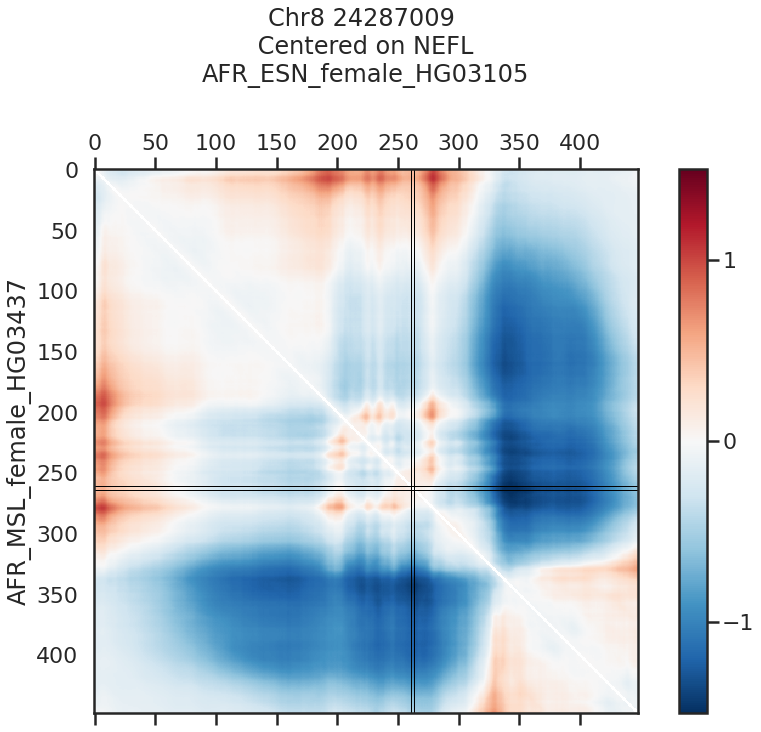

In [589]:
combo_mat = from_upper_triu_combo(pred1, pred2, target_length1_cropped, hic_diags)
diff_mat = mat2-mat1
name = 'Chr8 24287009 \n Centered on NEFL \n' + ind1

plt.figure(figsize=(15,10))
vmin=-1.5; vmax=1.5
im = plt.matshow(combo_mat, fignum=False, cmap= 'RdBu_r', vmax=vmax, vmin=vmin)
plt.colorbar(im, fraction=.04, pad = 0.05, ticks=[-2,-1, 0, 1,2]);
plt.title(name,y=1.15 )
plt.ylabel(ind2)



x1 = (gene_start-start)/2000
x2 = (gene_end-start)/2000

plt.axvline(x=x1,color='black', linewidth=1)
plt.axvline(x=x2,color='black', linewidth=1)

plt.axhline(y=x1,color='black', linewidth=1)
plt.axhline(y=x2,color='black', linewidth=1)

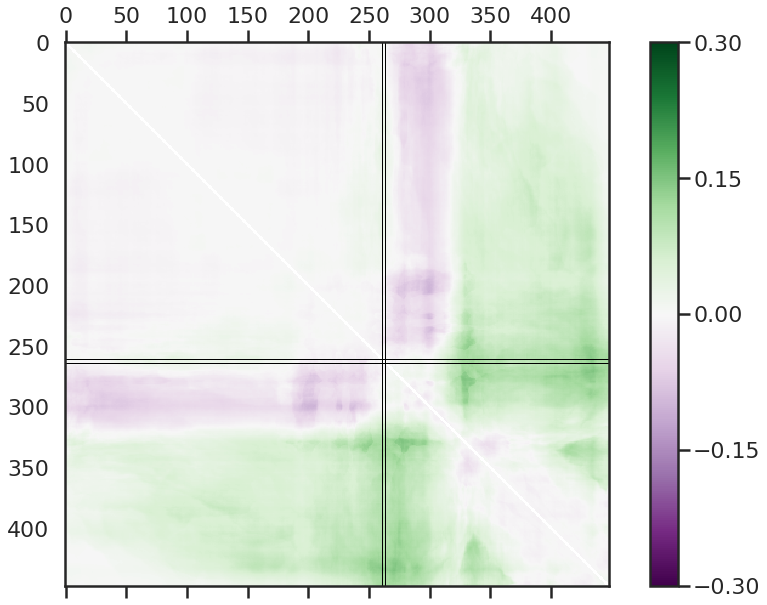

In [590]:
plt.figure(figsize=(15,10))
vmin=-.3; vmax=.3
im = plt.matshow(diff_mat, fignum=False, cmap= 'PRGn', vmax=vmax, vmin=vmin)
plt.colorbar(im, fraction=.04, pad = 0.05, ticks=[-.15,-.3, 0, .15,.3]);

plt.axvline(x=x1,color='black', linewidth=1)
plt.axvline(x=x2,color='black', linewidth=1)

plt.axhline(y=x1,color='black', linewidth=1)
plt.axhline(y=x2,color='black', linewidth=1)

## 3DFst

### AFR-AFR

In [68]:
popfst3D = {}
for cur_pop in afr_pops:
    bm, wm = one_pop_mses(cur_pop, afr_pops)
    popfst3D[cur_pop] = fst3D(bm,wm, avg=True)
    
popfst3D

{'ESN': 0.02069124738317068,
 'MSL': 0.00312508997589704,
 'LWK': 0.005718763955361721,
 'GWD': 0.005336106779736623}

In [69]:
comps_dict = dict.fromkeys(afr_pops.keys())
for pop in comps_dict:
    comps_dict[pop]= one_pop_comps(pop)

In [164]:
comp_avgs = pairs_20afr_mse[['chr', 'windowStartPos']]

In [165]:
for pop in comps_dict:
    wname = str(pop+'_within')
    bname = str(pop+ '_between')
    fname = str(pop + '_3DFst')
    w = pairs_20afr_mse[comps_dict[pop][0]].mean(axis=1)
    b = pairs_20afr_mse[comps_dict[pop][1]].mean(axis=1)
    fst = fst3D(b, w, avg = False)
    comp_avgs.loc[:,wname] = w
    comp_avgs.loc[:,bname] = b
    comp_avgs.loc[:,fname] = fst

/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/pandas/core/indexing.py:845: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [166]:
stats.kruskal(comp_avgs.ESN_3DFst, comp_avgs.MSL_3DFst, comp_avgs.LWK_3DFst, comp_avgs.GWD_3DFst)

KruskalResult(statistic=3.1828087282847264, pvalue=0.36428933129438984)

In [167]:
def find_extrema(row):
    maxi = max(row.ESN_3DFst, row.MSL_3DFst, row.LWK_3DFst, row.GWD_3DFst)
    maxi_idx = row[['ESN_3DFst','MSL_3DFst', 'LWK_3DFst','GWD_3DFst']].astype('float').idxmax()
    mini = min(row.ESN_3DFst, row.MSL_3DFst, row.LWK_3DFst, row.GWD_3DFst)
    mini_idx = row[['ESN_3DFst','MSL_3DFst', 'LWK_3DFst','GWD_3DFst']].astype('float').idxmin()
    diff = abs(float(maxi)-float(mini))
    
    return float(diff)

In [168]:
comp_avgs['diffs'] = comp_avgs.apply(
    lambda row: find_extrema(row),
    axis=1
)

/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [169]:
comp_avgs = comp_avgs.sort_values(by=['diffs'], ascending=False)

In [170]:
comp_avgs.diffs

4074    1.979198
996     1.968716
1258    1.965622
2503    1.935709
2683    1.932142
          ...   
4702    0.049279
2050    0.047598
3300    0.040206
4643    0.038611
2322    0.030290
Name: diffs, Length: 4760, dtype: float64

(array([ 265.,  908., 1140.,  871.,  604.,  422.,  300.,  144.,   75.,
          31.]),
 array([0.03029048, 0.22518118, 0.42007189, 0.61496259, 0.8098533 ,
        1.004744  , 1.19963471, 1.39452541, 1.58941612, 1.78430682,
        1.97919753]),
 <a list of 10 Patch objects>)

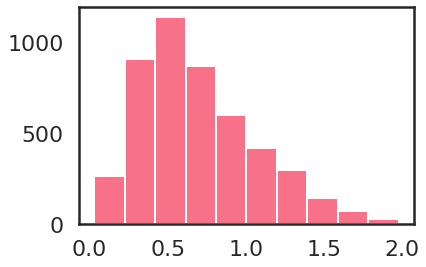

In [171]:
plt.hist(comp_avgs.diffs)

In [172]:
comp_avgs[comp_avgs.chr=='chr22'][comp_avgs.diffs >= 1]

/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


,chr,windowStartPos,ESN_within,ESN_between,ESN_3DFst,MSL_within,MSL_between,MSL_3DFst,LWK_within,LWK_between,LWK_3DFst,GWD_within,GWD_between,GWD_3DFst,diffs
4752,chr22,45613056,0.006973,0.003561,-0.958277,0.000175,0.001348,0.870114,0.000221,0.001347,0.836037,0.000329,0.001433,0.770391,1.828391
4706,chr22,21495808,0.004931,0.002574,-0.915334,0.000189,0.000998,0.810898,0.000201,0.000985,0.796131,0.000217,0.000998,0.782775,1.726232
4707,chr22,22020096,0.006059,0.003219,-0.882007,0.000366,0.001377,0.734293,0.000960,0.001499,0.359560,0.000269,0.001328,0.797699,1.679705
4753,chr22,46137344,0.006101,0.003192,-0.911228,0.000308,0.001271,0.757258,0.000469,0.001316,0.643658,0.000333,0.001333,0.750220,1.668486
4748,chr22,43515904,0.000425,0.001362,0.687927,0.004973,0.002659,-0.870108,0.000739,0.001290,0.427215,0.000615,0.001265,0.513545,1.558035
4719,chr22,28311552,0.000321,0.000292,-0.100518,0.000074,0.000229,0.676239,0.000623,0.000398,-0.565091,0.000225,0.000296,0.241201,1.241331
4739,chr22,38797312,0.000271,0.000579,0.532317,0.001473,0.000954,-0.543644,0.000474,0.000629,0.246662,0.000448,0.000615,0.271701,1.075961
4713,chr22,25165824,0.001155,0.001031,-0.120032,0.000929,0.000817,-0.136605,0.000127,0.000759,0.832134,0.001071,0.000873,-0.226135,1.058269


In [221]:
def basic_fst_plot_afr(df):
    fig, ax = plt.subplots(figsize=[40,10])
    sns.lineplot(y=df.ESN_3DFst, 
                 x=df.windowStartPos, 
                label='ESN')
    sns.lineplot(y=df.LWK_3DFst,
                 x=df.windowStartPos, 
                label='LWK')
    sns.lineplot(y=df.MSL_3DFst,
                 x=df.windowStartPos, 
                label='MSL')
    sns.lineplot(y=df.GWD_3DFst,
                 x=df.windowStartPos, 
                label='GWD')
    ax.vlines(x=df[df.diffs>=1].windowStartPos, ymin=-1, ymax=1)
    #plt.legend(bbox_to_anchor=(1.2, 0.5))
    plt.title(df.iloc[1].chr)
    plt.ylabel('3DFst')

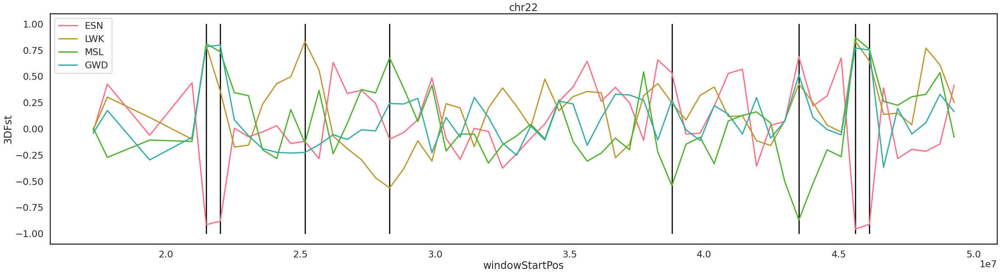

In [252]:
basic_fst_plot_afr(comp_avgs[comp_avgs.chr=='chr22'])

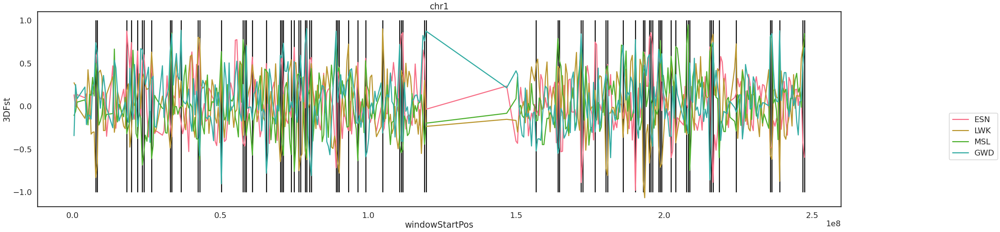

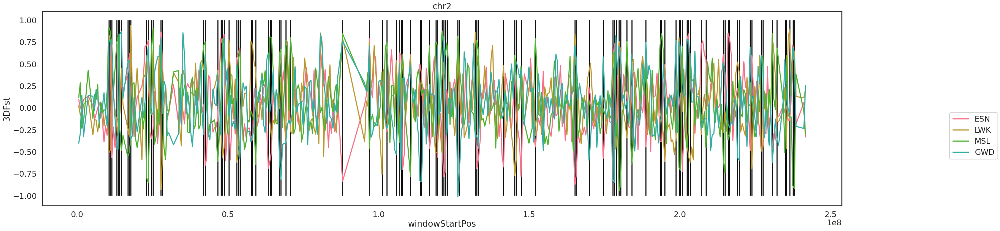

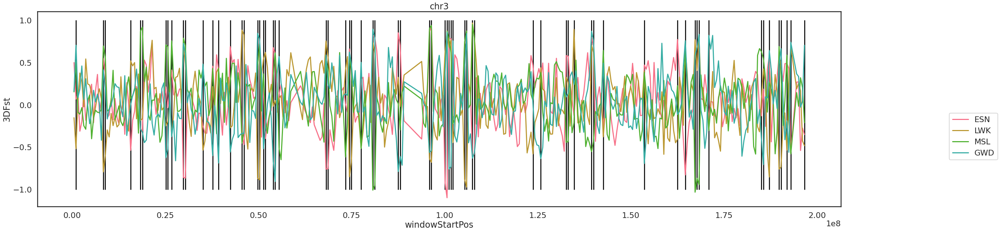

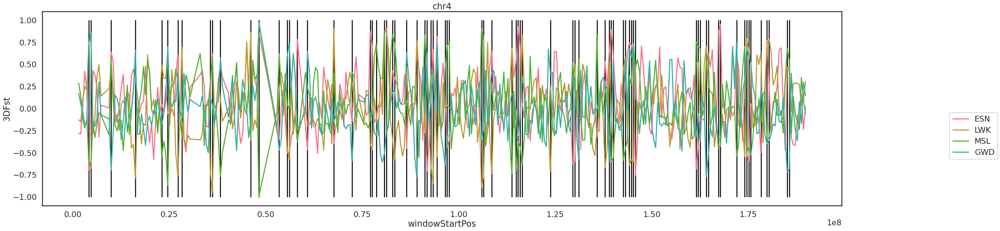

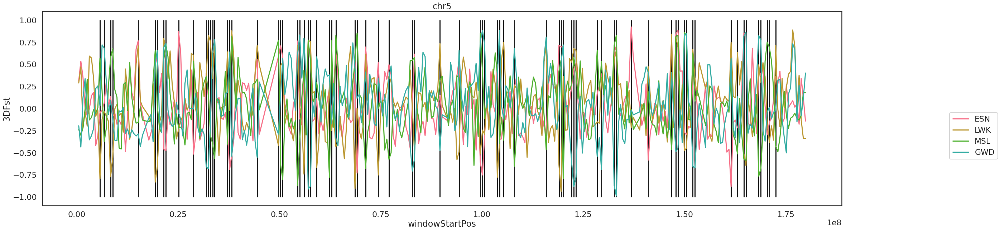

...

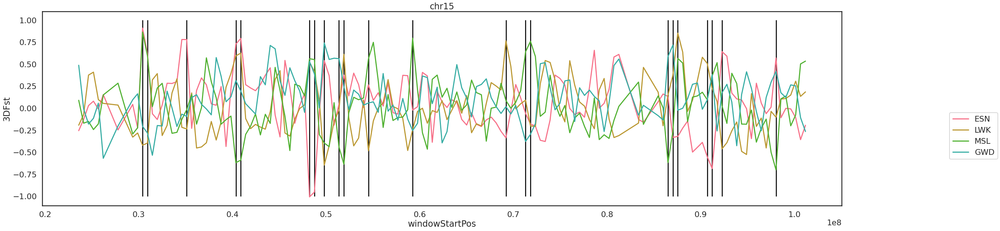

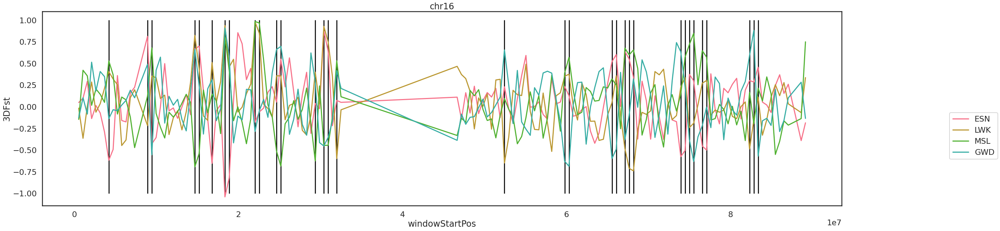

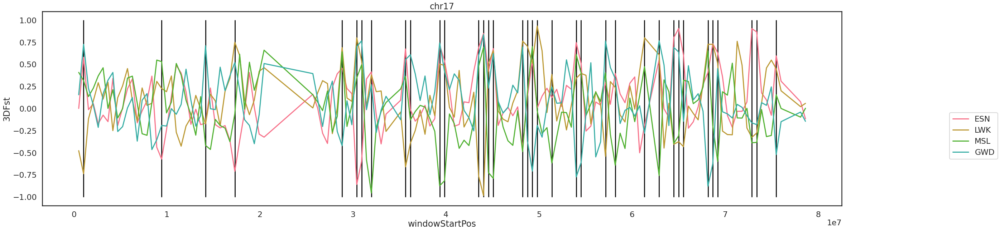

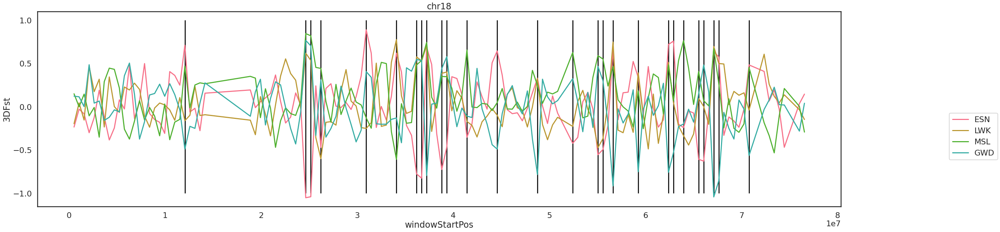

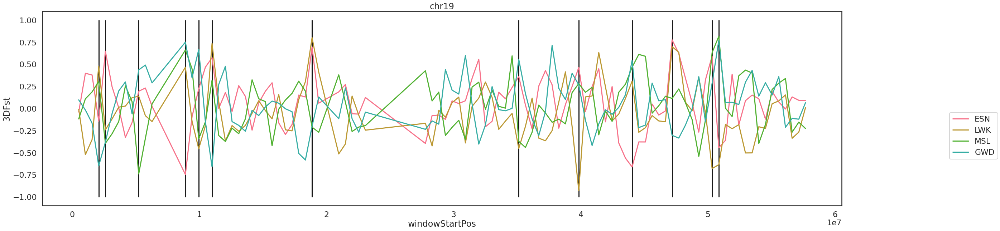

In [220]:
chrs = chrs[:-1]
for chrm in chrs:
    basic_fst_plot_afr(comp_avgs[comp_avgs.chr==chrm])

['chr1',
 'chr2',
 'chr3',
 'chr4',
 'chr5',
 'chr6',
 'chr7',
 'chr8',
 'chr9',
 'chr10',
 'chr11',
 'chr12',
 'chr13',
 'chr14',
 'chr15',
 'chr16',
 'chr17',
 'chr18',
 'chr19',
 'chr20',
 'chr21',
 'chr22']

### All Super pops

In [47]:
popfst3D = {}
for cur_pop in super_pops:
    bm, wm = one_pop_mses(cur_pop, super_pops)
    popfst3D[cur_pop] = fst3D(bm,wm, avg=True)
    
popfst3D

{'AFR': 0.016069707575948795,
 'AMR': 0.09329771859563965,
 'EAS': 0.2147935413296217,
 'EUR': 0.1356206339623333,
 'SAS': 0.11444607275648021}

In [48]:
comps_dict = dict.fromkeys(super_pops.keys())
for pop in comps_dict:
    comps_dict[pop]= one_pop_comps(pop, super_pops)

AFR
AMR
EAS
EUR
SAS
AFR
AMR
EAS
EUR
SAS
AFR
AMR
EAS
EUR
SAS
AFR
AMR
EAS
EUR
SAS
AFR
AMR
EAS
EUR
SAS


In [49]:
comp_avgs = all_mse[['chr', 'windowStartPos']]

In [50]:
for pop in comps_dict:
    wname = str(pop+'_within')
    bname = str(pop+ '_between')
    fname = str(pop + '_3DFst')
    w = all_mse[comps_dict[pop][0]].mean(axis=1)
    b = all_mse[comps_dict[pop][1]].mean(axis=1)
    fst = fst3D(b, w, avg = False)
    comp_avgs.loc[:,wname] = w
    comp_avgs.loc[:,bname] = b
    comp_avgs.loc[:,fname] = fst

/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/pandas/core/indexing.py:845: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [51]:
def find_extrema(row):
    maxi = max(row.AFR_3DFst, row.EUR_3DFst, row.EAS_3DFst, row.SAS_3DFst, row.AMR_3DFst)
    maxi_idx = row[['AFR_3DFst','EUR_3DFst', 'EAS_3DFst','SAS_3DFst', 'AMR_3DFst']].astype('float').idxmax()
    mini = min(row.AFR_3DFst, row.EUR_3DFst, row.EAS_3DFst, row.SAS_3DFst, row.AMR_3DFst)
    mini_idx = row[['AFR_3DFst','EUR_3DFst', 'EAS_3DFst','SAS_3DFst', 'AMR_3DFst']].astype('float').idxmin()
    diff = abs(float(maxi)-float(mini))
    
    return float(diff)

In [52]:
comp_avgs['diffs'] = comp_avgs.apply(
    lambda row: find_extrema(row),
    axis=1)
comp_avgs = comp_avgs.sort_values(by=['diffs'], ascending=False)

/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


(array([ 357., 1033., 1165.,  821.,  590.,  361.,  249.,  105.,   48.,
          20.]),
 array([0.04276614, 0.21876845, 0.39477076, 0.57077308, 0.74677539,
        0.9227777 , 1.09878001, 1.27478232, 1.45078463, 1.62678694,
        1.80278925]),
 <a list of 10 Patch objects>)

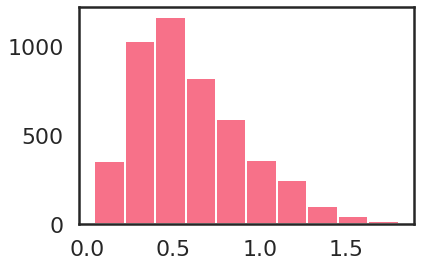

In [53]:
plt.hist(comp_avgs.diffs)

In [54]:
roi = comp_avgs[comp_avgs.diffs >= 1]

In [55]:
roi.shape

(609, 18)

In [56]:
roi

,chr,windowStartPos,AFR_within,AFR_between,AFR_3DFst,AMR_within,AMR_between,AMR_3DFst,EAS_within,EAS_between,EAS_3DFst,EUR_within,EUR_between,EUR_3DFst,SAS_within,SAS_between,SAS_3DFst,diffs
1005,chr3,105906176,0.003236,0.001652,-0.959203,0.000066,0.000425,0.843586,0.000077,0.000441,0.826012,0.000131,0.000446,0.707338,0.000160,0.000450,0.645513,1.802789
1438,chr4,149946368,0.000098,0.000292,0.664245,0.000048,0.000280,0.827576,0.001536,0.000812,-0.891788,0.000043,0.000281,0.845897,0.000041,0.000282,0.854719,1.746507
2574,chr8,91226112,0.002773,0.001494,-0.855773,0.000064,0.000347,0.815417,0.000044,0.000371,0.881334,0.000056,0.000361,0.845606,0.000066,0.000361,0.817168,1.737107
1359,chr4,108527616,0.000310,0.000373,0.170272,0.001686,0.000898,-0.878293,0.000102,0.000308,0.669829,0.000086,0.000296,0.709735,0.000044,0.000288,0.848187,1.726480
2968,chr10,68157440,0.003736,0.001943,-0.923327,0.000152,0.000518,0.706852,0.000140,0.000562,0.751587,0.000109,0.000523,0.792305,0.000120,0.000540,0.777574,1.715632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440,chr2,28311552,0.000649,0.000736,0.118031,0.001242,0.000988,-0.256834,0.000872,0.000793,-0.100324,0.000143,0.000568,0.747495,0.000530,0.000663,0.200303,1.004329
3699,chr13,96993280,0.000377,0.000268,-0.410073,0.000056,0.000107,0.478646,0.000045,0.000111,0.592269,0.000127,0.000133,0.046990,0.000080,0.000120,0.336216,1.002342
4564,chr20,16777216,0.002624,0.002115,-0.240731,0.000143,0.000547,0.739089,0.000142,0.000595,0.761276,0.000149,0.000568,0.738057,0.000138,0.000556,0.751328,1.002007
1611,chr5,56098816,0.000473,0.000601,0.212527,0.000470,0.000581,0.190717,0.000171,0.000525,0.674794,0.001191,0.000898,-0.326986,0.000895,0.000750,-0.193118,1.001780


In [57]:
roi_bed = roi[['chr','windowStartPos']]

In [58]:
roi_bed['windowEndPos'] = roi_bed.windowStartPos + (2*20)

/home/gilbee3/anaconda3/envs/akita/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [59]:
roi_bed=roi_bed.sort_values(by=['chr','windowStartPos'])

In [60]:
roi_bed.to_csv('3DFst_diff1.bed', sep='\t', header=False, index=False)

In [61]:
roi=roi.sort_values(by=['chr','windowStartPos'])

In [62]:
2**20

1048576

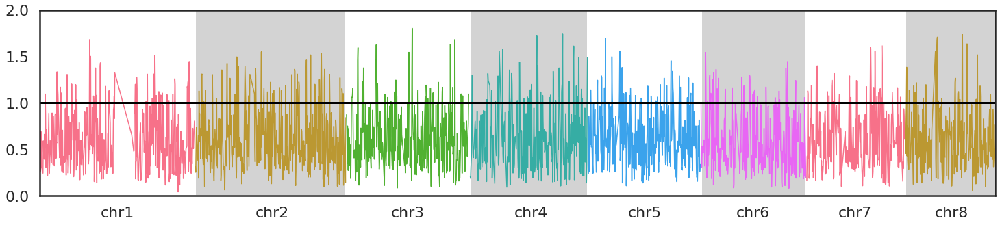

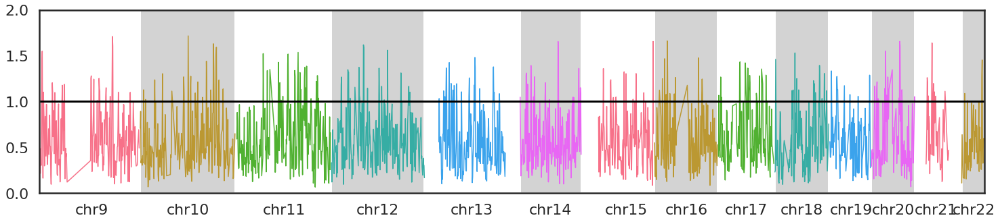

In [69]:
chroms = ['chr1','chr2','chr3','chr4','chr5','chr6','chr7','chr8'] # did this to split the plot into a top panel and bottom, but you could just put all chroms here for 1 linear plot

fig = plt.figure(figsize=(25,5))
x_labels = []
x_labels_pos = []
ax = fig.add_subplot(111)
ax.set_facecolor('white')


maxLoc = 0
num = 0
for chrm in chroms:
    num+=1
    comp_avgs['center_loc'] = (comp_avgs['windowStartPos'] + 2**20)/2 + maxLoc # center_loc is the midway point in the region
    _ = plt.plot( 'center_loc','diffs',data = comp_avgs[comp_avgs['chr'] == chrm], lw=1.5)
    maxLoc = comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].max() + 10 # max loc iteratively becomes larger with each chromosome to place everything on the same x-axis. Remove the + 10 if you don't want space between the chroms
    x_labels_pos.append(comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].mean()) # save the position for the xlabels
    if (num % 2) == 0: # alternate gray and white background
        _ = ax.axvspan(comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].min(), comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].max(), facecolor='lightgray')
_ = ax.set_xticks(x_labels_pos)
_ = ax.set_xticklabels(chroms)
_ = ax.set_xlim(0,maxLoc)
_ = ax.set_ylim(0,2)
_=ax.axhline(y=1, color='black')
maxLocOld = maxLoc
plt.show()

# second half of the fig

chroms = ['chr9','chr10','chr11','chr12','chr13','chr14','chr15','chr16','chr17','chr18','chr19','chr20','chr21','chr22']
fig = plt.figure(figsize=(25,5))
x_labels = []
x_labels_pos = []

ax = fig.add_subplot(111)
maxLoc = 0
num = 0
for chrm in chroms:
    num+=1
    comp_avgs['center_loc'] = (comp_avgs['windowStartPos'] + 2**20)/2 + maxLoc
    _ = plt.plot( 'center_loc','diffs',data = comp_avgs[comp_avgs['chr'] == chrm], lw=1.5)
    maxLoc = comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].max()
    x_labels_pos.append(comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].mean())
    if (num % 2) == 0:
        _ = ax.axvspan(comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].min(), comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].max(), facecolor='lightgray')
_ = ax.set_xticks(x_labels_pos)
_ = ax.set_xticklabels(chroms)
_ = ax.set_xlim(0,maxLoc) # this is to scale so the top panel and bottom panel have the same scale (will leave some white space behind the x chrom)
_ = ax.set_ylim(0,2)
_=ax.axhline(y=1, color='black')

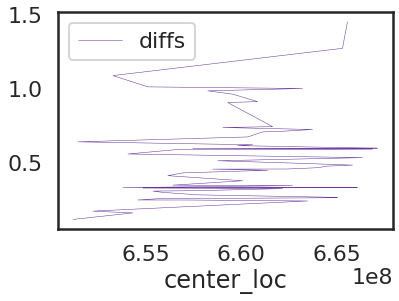

In [66]:
 comp_avgs[comp_avgs['chr'] == 'chr22'].plot(kind='line',x='center_loc',y='diffs',color='rebeccapurple', linewidth=0.5)

In [67]:
comp_avgs = comp_avgs.sort_values(by=['chr','windowStartPos'])

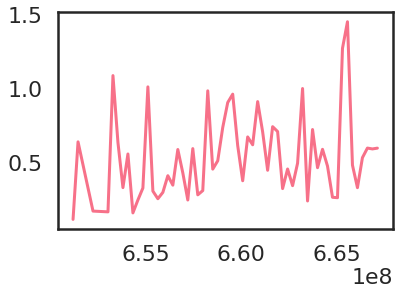

In [68]:
plt.plot( 'center_loc','diffs',data = comp_avgs[comp_avgs['chr'] == 'chr22'])

In [65]:
(roi['windowStartPos'] + 2**20)/2

10       4456448.0
41      13893632.0
43      14417920.0
44      14680064.0
48      16515072.0
           ...    
2803    51380224.0
2804    51642368.0
2805    51904512.0
2820    55836672.0
2852    64225280.0
Name: windowStartPos, Length: 609, dtype: float64

## Regions divergent from whole genome average

In [137]:
def compare_to_whole_genome(row, genome):
    region = row[2:].values
    u, p = stats.mannwhitneyu(region, genome)
    umax = len(region) * len(genome)
    e = u/umax
    row['u'], row['p'], row['e'] = u,p,e
    return row

In [142]:
pairs_20afr_spearman = pairs_20afr_spearman.apply(lambda row: 
                            compare_to_whole_genome(row,super_spears['AFR'] ),axis=1)

pairs_amr_spearman = pairs_amr_spearman.apply(lambda row: 
                            compare_to_whole_genome(row,super_spears['AMR'] ),axis=1)

pairs_eas_spearman = pairs_eas_spearman.apply(lambda row: 
                            compare_to_whole_genome(row,super_spears['EAS'] ),axis=1)

pairs_eur_spearman = pairs_eur_spearman.apply(lambda row: 
                            compare_to_whole_genome(row,super_spears['EUR'] ),axis=1)

pairs_sas_spearman = pairs_sas_spearman.apply(lambda row: 
                            compare_to_whole_genome(row,super_spears['SAS'] ),axis=1)

In [143]:
pairs_20afr_spearman[pairs_20afr_spearman.p <0.05]

,chr,windowStartPos,AFR_MSL_female_HG03086_VS_AFR_MSL_female_HG03378,AFR_MSL_female_HG03086_VS_AFR_MSL_female_HG03437,AFR_LWK_female_NA19378_VS_AFR_MSL_female_HG03086,AFR_LWK_female_NA19445_VS_AFR_MSL_female_HG03086,AFR_LWK_female_NA19434_VS_AFR_MSL_female_HG03086,AFR_MSL_female_HG03086_VS_AFR_MSL_female_HG03212,AFR_GWD_female_HG03040_VS_AFR_MSL_female_HG03086,AFR_GWD_female_HG03028_VS_AFR_MSL_female_HG03086,...,AFR_ESN_female_HG02922_VS_AFR_ESN_female_HG03105,AFR_ESN_female_HG03511_VS_AFR_ESN_female_HG03514,AFR_ESN_female_HG03499_VS_AFR_ESN_female_HG03511,AFR_ESN_female_HG02922_VS_AFR_ESN_female_HG03511,AFR_ESN_female_HG03499_VS_AFR_ESN_female_HG03514,AFR_ESN_female_HG02922_VS_AFR_ESN_female_HG03514,AFR_ESN_female_HG02922_VS_AFR_ESN_female_HG03499,u,p,e
0,chr1,524288,0.998365,0.998215,0.998841,0.999427,0.999099,0.998611,0.998912,0.998728,...,0.998481,0.998735,0.997988,0.998111,0.998371,0.998390,0.999264,422.0,3.265917e-61,0.011690
2,chr1,1572864,0.994742,0.997934,0.997378,0.997716,0.997611,0.998351,0.996939,0.995822,...,0.999071,0.998018,0.997352,0.996243,0.998724,0.998063,0.998446,5176.0,1.319078e-33,0.143380
3,chr1,4194304,0.998353,0.997639,0.984380,0.994364,0.989171,0.988441,0.997469,0.991921,...,0.991684,0.995315,0.996287,0.984060,0.993971,0.988849,0.978028,7242.0,2.911064e-24,0.200609
4,chr1,4718592,0.980287,0.989268,0.985869,0.982767,0.986586,0.985739,0.979930,0.979279,...,0.993491,0.988524,0.982030,0.978961,0.995667,0.994001,0.996227,8844.0,4.038779e-18,0.244986
5,chr1,5242880,0.993730,0.996828,0.995234,0.996221,0.995559,0.994644,0.993329,0.993504,...,0.997527,0.998998,0.995378,0.996103,0.997836,0.997372,0.997653,8227.0,2.262083e-20,0.227895
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4754,chr22,46661632,0.998392,0.998687,0.999195,0.998249,0.994844,0.998892,0.999282,0.995378,...,0.997963,0.999420,0.999231,0.999290,0.999425,0.999610,0.999406,4089.0,3.625827e-39,0.113269
4755,chr22,47185920,0.996925,0.998342,0.996188,0.998570,0.996235,0.998971,0.997807,0.995809,...,0.989381,0.997706,0.998414,0.997488,0.997772,0.997423,0.998132,10536.0,1.124882e-12,0.291856
4757,chr22,48234496,0.976409,0.997321,0.995246,0.995991,0.994921,0.964340,0.997528,0.955910,...,0.919449,0.990932,0.878848,0.991296,0.915019,0.995774,0.907404,5419.0,2.007099e-32,0.150111
4758,chr22,48758784,0.980817,0.996574,0.986317,0.987389,0.986431,0.977845,0.998023,0.973266,...,0.897745,0.986624,0.856415,0.992228,0.907874,0.995915,0.892879,2548.0,8.185068e-48,0.070582


In [148]:
all_avg = all_spearman.mean()[1:]

In [149]:
all_spearman= all_spearman.apply(lambda row: 
                            compare_to_whole_genome(row,all_avg ),axis=1)

In [192]:
all_spearman.sort_values(by=p)

NameError: name 'p' is not defined

In [171]:
pairs_amr_spearman.p.describe()

count    4.760000e+03
mean     1.476935e-02
std      6.348138e-02
min      1.795116e-77
25%      1.866482e-77
50%      1.308830e-55
75%      2.107937e-19
max      4.991659e-01
Name: p, dtype: float64

In [176]:
comp_avgs['all_dist_e'] = all_spearman.e
comp_avgs['afr_dist_e'] = pairs_20afr_spearman.e
comp_avgs['eas_dist_e'] = pairs_eas_spearman.e
comp_avgs['eur_dist_e'] = pairs_eur_spearman.e
comp_avgs['amr_dist_e'] = pairs_amr_spearman.e
comp_avgs['sas_dist_e'] = pairs_sas_spearman.e

In [189]:
corrs = comp_avgs[['afr_dist_p','eas_dist_p','eur_dist_p',
                   'amr_dist_p','sas_dist_p' , 'AFR_3DFst','AMR_3DFst','EAS_3DFst','EUR_3DFst',
                  'SAS_3DFst']]

KeyError: "['eur_dist_e', 'afr_dist_e', 'eas_dist_e'] not in index"

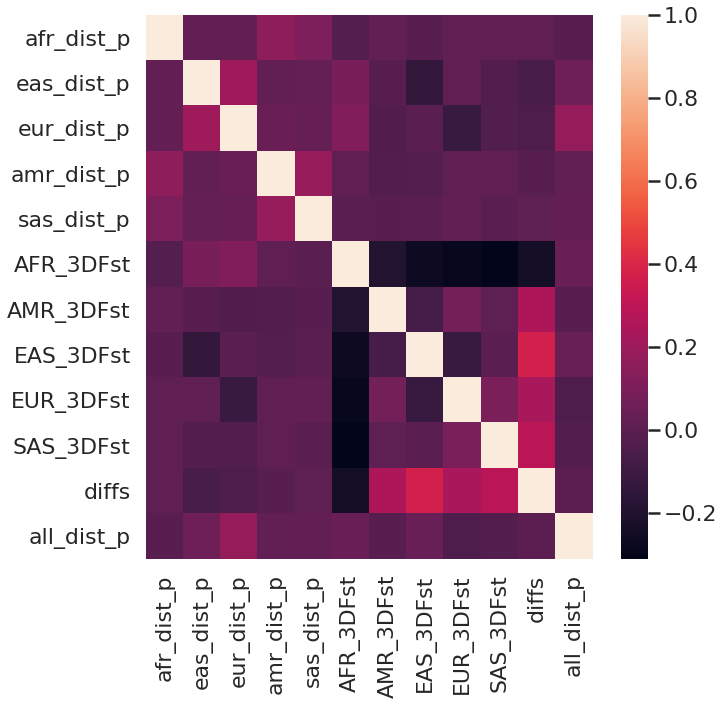

In [188]:
correlation_mat = corrs.corr()
plt.figure(figsize=[10,10])
sns.heatmap(correlation_mat, annot = False)


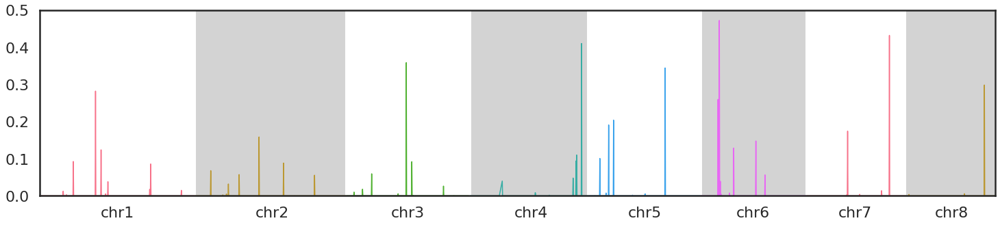

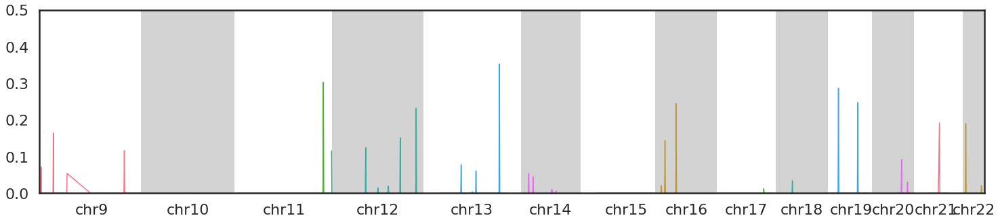

In [191]:
chroms = ['chr1','chr2','chr3','chr4','chr5','chr6','chr7','chr8'] # did this to split the plot into a top panel and bottom, but you could just put all chroms here for 1 linear plot

fig = plt.figure(figsize=(25,5))
x_labels = []
x_labels_pos = []
ax = fig.add_subplot(111)
ax.set_facecolor('white')


maxLoc = 0
num = 0
for chrm in chroms:
    num+=1
    comp_avgs['center_loc'] = (comp_avgs['windowStartPos'] + 2**20)/2 + maxLoc # center_loc is the midway point in the region
    _ = plt.plot( 'center_loc','all_dist_p',data = comp_avgs[comp_avgs['chr'] == chrm], lw=1.5)
    maxLoc = comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].max() + 10 # max loc iteratively becomes larger with each chromosome to place everything on the same x-axis. Remove the + 10 if you don't want space between the chroms
    x_labels_pos.append(comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].mean()) # save the position for the xlabels
    if (num % 2) == 0: # alternate gray and white background
        _ = ax.axvspan(comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].min(), comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].max(), facecolor='lightgray')
_ = ax.set_xticks(x_labels_pos)
_ = ax.set_xticklabels(chroms)
_ = ax.set_xlim(0,maxLoc)
_ = ax.set_ylim(0,0.5)
maxLocOld = maxLoc
plt.show()

# second half of the fig

chroms = ['chr9','chr10','chr11','chr12','chr13','chr14','chr15','chr16','chr17','chr18','chr19','chr20','chr21','chr22']
fig = plt.figure(figsize=(25,5))
x_labels = []
x_labels_pos = []

ax = fig.add_subplot(111)
maxLoc = 0
num = 0
for chrm in chroms:
    num+=1
    comp_avgs['center_loc'] = (comp_avgs['windowStartPos'] + 2**20)/2 + maxLoc
    _ = plt.plot( 'center_loc','all_dist_p',data = comp_avgs[comp_avgs['chr'] == chrm], lw=1.5)
    maxLoc = comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].max()
    x_labels_pos.append(comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].mean())
    if (num % 2) == 0:
        _ = ax.axvspan(comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].min(), comp_avgs[comp_avgs['chr'] == chrm]['center_loc'].max(), facecolor='lightgray')
_ = ax.set_xticks(x_labels_pos)
_ = ax.set_xticklabels(chroms)
_ = ax.set_xlim(0,maxLoc) # this is to scale so the top panel and bottom panel have the same scale (will leave some white space behind the x chrom)
_ = ax.set_ylim(0,0.5)
_=ax.axhline(y=1, color='black')